## **Textual Insights" : A Deep Dive into Cyberbullying Detection Through Interpretable AI**

<br></br>
### **Package Installation**

In [ ]:
!pip install lime
!pip install shap
!pip install captum
!pip install bertviz
!pip install langdetect
!pip install contractions
!pip install emoji==1.4.1
!pip install black[jupyter]

<br></br>
### **Import libraries**

In [ ]:
# Libraries for general purpose
import os
import time
import emoji
import random
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sns
from google.colab import drive
import matplotlib.pyplot as plt

# Text cleaning
import re
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer

# Data preprocessing
import contractions
from sklearn import preprocessing
from nltk.tokenize import word_tokenize
from langdetect import detect, LangDetectException
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import classification_report, confusion_matrix


# PyTorch LSTM
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

# Tokenization for LSTM
from collections import Counter
from gensim.models import Word2Vec

# Transformers library for BERT
import transformers
from transformers import BertModel
from transformers import BertConfig
from transformers import BertTokenizer
from transformers import AdamW, get_linear_schedule_with_warmup
from sklearn.metrics import classification_report, confusion_matrix

# NLTK
import nltk
nltk.download("punkt")
nltk.download("wordnet")
nltk.download("stopwords")

# LIME
from lime.lime_text import LimeTextExplainer

# SHAP
import shap

# Integrated Gradients
from captum.attr import visualization
from captum.attr import IntegratedGradients
from captum.attr import InterpretableEmbeddingBase, TokenReferenceBase
from captum.attr import configure_interpretable_embedding_layer, remove_interpretable_embedding_layer

# BertViz
from bertviz import head_view, model_view
from transformers import BertTokenizer, BertModel

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<br></br>
### **Setting Reproducibility and Styling for Visualizations**


In [ ]:
# Set seed for reproducibility
seed_value = 2042
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)

# Set style for plots
sns.set_style("whitegrid")
sns.despine()
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold", titlepad=10)

<ipython-input-3-bacf7a54f5cb>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


<Figure size 640x480 with 0 Axes>

<br></br>
### **Setting Up the Drive Connection**

In [ ]:
# Let's mount the drive to load the images
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<br></br>
### **Initializing Text Preprocessing steps**


In [ ]:
# Define stop words for text cleaning
stop_words = set(stopwords.words("english"))

# Initialize lemmatizer for text cleaning
lemmatizer = WordNetLemmatizer()

<br></br>
### **Data Import**

In [ ]:
# Let's define base_directory to load the dataset
base_directory = "/content/drive/My Drive/IML_final_project_data/"

# Let's load the cyberbullying classification dataset from drive
cyberbullying_df = pd.read_csv(f"{base_directory}/cyberbullying_tweets.csv")

# Let's take a quick look at the shape of the dataframe
print("Cyberbullying Tweets data shape -->", cyberbullying_df.shape)
print()

# Let's take a brief look at the contents of the dataframe
cyberbullying_df.head(10)

Cyberbullying Tweets data shape --> (47692, 2)



,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
5,"@Raja5aab @Quickieleaks Yes, the test of god i...",not_cyberbullying
6,Itu sekolah ya bukan tempat bully! Ga jauh kay...,not_cyberbullying
7,Karma. I hope it bites Kat on the butt. She is...,not_cyberbullying
8,@stockputout everything but mostly my priest,not_cyberbullying
9,Rebecca Black Drops Out of School Due to Bully...,not_cyberbullying


<br></br>
### **Getting insights from data**

In [ ]:
# Let's obtain a brief overview of the cyberbullying dataframe
cyberbullying_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


<br></br>
### **Data Cleaning**

In [ ]:
# Let's rename the columns using shorter words for easier reference.
cyberbullying_df = cyberbullying_df.rename(
    columns={"tweet_text": "text", "cyberbullying_type": "sentiment"}
)

<br></br>
#### **Are there duplicated tweets?**

In [ ]:
# Let's check for duplicated values in cyberbullying data_frame
print(
    "Cyberbullying Dataset Duplicate Values Count --> ",
    cyberbullying_df.duplicated().sum(),
)

Cyberbullying Dataset Duplicate Values Count -->  36


<br></br>
#### **Drop duplicate values**

In [ ]:
# Let's drop the duplicate values from the cyberbullying dataframe
cyberbullying_df = cyberbullying_df.drop_duplicates()

# Let's take a quick look at the shape of the dataframe
print("Cyberbullying Tweets data shape -->", cyberbullying_df.shape)
print()

# Let's take a brief look at the contents of the dataframe
cyberbullying_df.head(5)

Cyberbullying Tweets data shape --> (47656, 2)



,text,sentiment
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


<br></br>
#### **Are the classes balanced?**

In [ ]:
# Let's get unique_counts of sentiment column
cyberbullying_df.sentiment.value_counts()

sentiment
religion               7997
age                    7992
ethnicity              7959
gender                 7948
not_cyberbullying      7937
other_cyberbullying    7823
Name: count, dtype: int64

<br></br>
### **Tweets text deep cleaning**

In [ ]:
# Clean emojis from text
def strip_emoji(text):
    return emoji.get_emoji_regexp().sub("", text)


# Remove punctuations, stopwords, links, mentions and new line characters
def strip_all_entities(text):
    text = re.sub(
        r"\r|\n", " ", text.lower()
    )  # Replace newline and carriage return with space, and convert to lowercase
    text = re.sub(r"(?:\@|https?\://)\S+", "", text)  # Remove links and mentions
    text = re.sub(r"[^\x00-\x7f]", "", text)  # Remove non-ASCII characters
    banned_list = string.punctuation
    table = str.maketrans("", "", banned_list)
    text = text.translate(table)
    text = " ".join(word for word in text.split() if word not in stop_words)
    return text


# Clean hashtags at the end of the sentence, and keep those in the middle of the sentence by removing just the # symbol
def clean_hashtags(tweet):
    # Remove hashtags at the end of the sentence
    new_tweet = re.sub(r"(\s+#[\w-]+)+\s*$", "", tweet).strip()

    # Remove the # symbol from hashtags in the middle of the sentence
    new_tweet = re.sub(r"#([\w-]+)", r"\1", new_tweet).strip()

    return new_tweet


# Filter special characters such as & and $ present in some words
def filter_chars(text):
    return " ".join(
        "" if ("$" in word) or ("&" in word) else word for word in text.split()
    )


# Remove multiple spaces
def remove_mult_spaces(text):
    return re.sub(r"\s\s+", " ", text)


# Function to check if the text is in English, and return an empty string if it's not
def filter_non_english(text):
    try:
        lang = detect(text)
    except LangDetectException:
        lang = "unknown"
    return text if lang == "en" else ""


# Expand contractions
def expand_contractions(text):
    return contractions.fix(text)


# Remove numbers
def remove_numbers(text):
    return re.sub(r"\d+", "", text)


# Lemmatize words
def lemmatize(text):
    words = word_tokenize(text)
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    return " ".join(lemmatized_words)


# Remove short words
def remove_short_words(text, min_len=2):
    words = text.split()
    long_words = [word for word in words if len(word) >= min_len]
    return " ".join(long_words)


# Replace elongated words with their base form
def replace_elongated_words(text):
    regex_pattern = r"\b(\w+)((\w)\3{2,})(\w*)\b"
    return re.sub(regex_pattern, r"\1\3\4", text)


# Remove repeated punctuation
def remove_repeated_punctuation(text):
    return re.sub(r"[\?\.\!]+(?=[\?\.\!])", "", text)


# Remove extra whitespace
def remove_extra_whitespace(text):
    return " ".join(text.split())


def remove_url_shorteners(text):
    return re.sub(
        r"(?:http[s]?://)?(?:www\.)?(?:bit\.ly|goo\.gl|t\.co|tinyurl\.com|tr\.im|is\.gd|cli\.gs|u\.nu|url\.ie|tiny\.cc|alturl\.com|ow\.ly|bit\.do|adoro\.to)\S+",
        "",
        text,
    )


# Remove spaces at the beginning and end of the tweet
def remove_spaces_tweets(tweet):
    return tweet.strip()


# Remove short tweets
def remove_short_tweets(tweet, min_words=3):
    words = tweet.split()
    return tweet if len(words) >= min_words else ""


# Function to call all the cleaning functions in the correct order
def clean_tweet(tweet):
    tweet = strip_emoji(tweet)
    tweet = expand_contractions(tweet)
    tweet = filter_non_english(tweet)
    tweet = strip_all_entities(tweet)
    tweet = clean_hashtags(tweet)
    tweet = filter_chars(tweet)
    tweet = remove_mult_spaces(tweet)
    tweet = remove_numbers(tweet)
    tweet = lemmatize(tweet)
    tweet = remove_short_words(tweet)
    tweet = replace_elongated_words(tweet)
    tweet = remove_repeated_punctuation(tweet)
    tweet = remove_extra_whitespace(tweet)
    tweet = remove_url_shorteners(tweet)
    tweet = remove_spaces_tweets(tweet)
    tweet = remove_short_tweets(tweet)
    tweet = " ".join(tweet.split())  # Remove multiple spaces between words
    return tweet

In [ ]:
# Let's apply all the text pre-processing functions to the input text
cyberbullying_df["text_clean"] = [
    clean_tweet(tweet) for tweet in cyberbullying_df["text"]
]

# Let's take a brief look at the contents of the dataframe
cyberbullying_df.head(5)

,text,sentiment,text_clean
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandre food crapilicious mkr
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussietv white mkr theblock imacelebrityau tod...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,classy whore red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh thanks head concerned another angry dude t...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretending kurdish account like is...


#### **Check duplicate tweets after cleaning?**

In [ ]:
# Let's check for duplicated values in cyberbullying data_frame
print(
    "Cyberbullying Dataset Duplicate Values Count --> ",
    cyberbullying_df.duplicated("text_clean").sum(),
)

Cyberbullying Dataset Duplicate Values Count -->  6256


<br></br>
#### **Drop duplicate values**

In [ ]:
# Let's drop the duplicate values from the cyberbullying dataframe
cyberbullying_df.drop_duplicates("text_clean", inplace=True)

# Let's take a quick look at the shape of the dataframe
print("Cyberbullying Tweets data shape -->", cyberbullying_df.shape)
print()

# Let's take a brief look at the contents of the dataframe
cyberbullying_df.head(5)

Cyberbullying Tweets data shape --> (41400, 3)



,text,sentiment,text_clean
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandre food crapilicious mkr
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussietv white mkr theblock imacelebrityau tod...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,classy whore red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh thanks head concerned another angry dude t...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretending kurdish account like is...


We removed the duplicated cleaned tweets. How is the class balance after the cleaning?

<br></br>
#### **Sentiment column value counts**

In [ ]:
# Let's get unique_counts of sentiment column
cyberbullying_df.sentiment.value_counts()

sentiment
religion               7921
age                    7815
ethnicity              7420
gender                 7271
not_cyberbullying      6068
other_cyberbullying    4905
Name: count, dtype: int64

<br></br>
We can see that lots of tweets of the class "other_cyberbullying" have been removed. Since the class is very unbalanced compared to the other classes and looks too "generic", we decide to remove the tweets labeled belonging to this class.<br>

EDIT: By performing some tests, the f1 score for predicting the "other_cyberbullying" resulted to be around 60%, a value far lower compared to the othter f1 scores (around 95% using LSTM model). This supports the decision of removing this generic class.

In [ ]:
# Let's filter the data_frame to exclude "Other Cyberbullying" sentiment
cyberbullying_df = cyberbullying_df[
    cyberbullying_df["sentiment"] != "other_cyberbullying"
]

# Let's get unique_counts of sentiment column
cyberbullying_df.sentiment.value_counts()

sentiment
religion             7921
age                  7815
ethnicity            7420
gender               7271
not_cyberbullying    6068
Name: count, dtype: int64

In [ ]:
# Let's define the list of sentiments which will be useful for future plots
sentiments = ["religion", "age", "ethnicity", "gender", "not bullying"]

<br></br>
### **Tweets length analysis**

In [ ]:
# Let's define a new data_frame column containing the length of the cleaned tweets in terms of number of words
cyberbullying_df["text_len"] = [
    len(text.split()) for text in cyberbullying_df.text_clean
]

<ipython-input-19-3b8bb636fcf5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cyberbullying_df["text_len"] = [


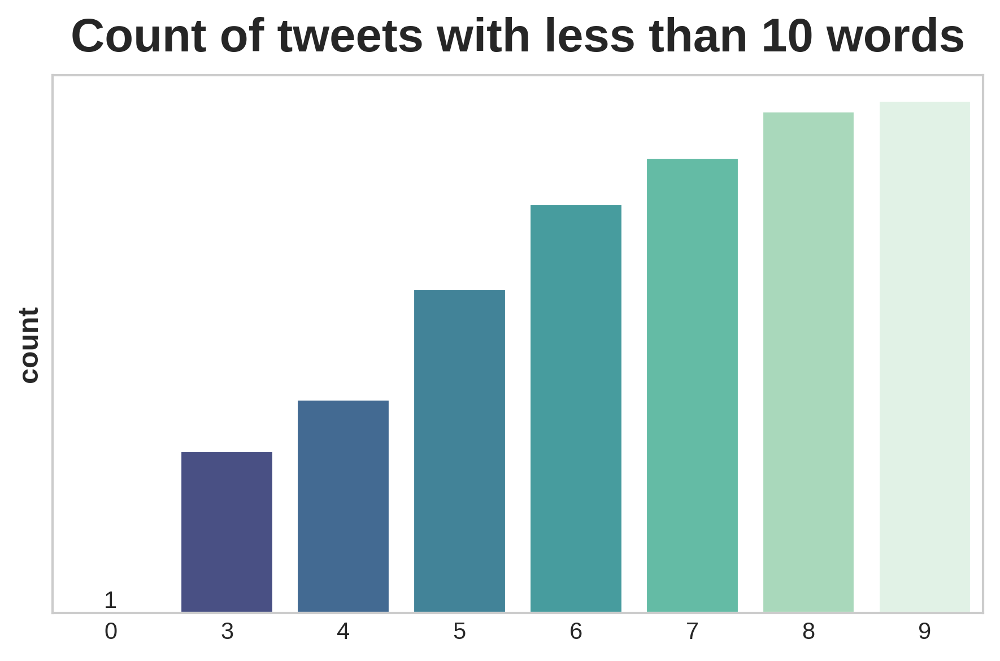

In [ ]:
# Set the size of the plot to 7*5 inches
plt.figure(figsize=(6, 4), dpi=300)
# Create a bar plot of text lengths less than 10 from the dataframe
ax = sns.countplot(
    x="text_len",
    hue="text_len",
    data=cyberbullying_df[cyberbullying_df["text_len"] < 10],
    palette="mako",
    legend=False,
)
# Add a title to the plot and set the font size to 20
plt.title("Count of tweets with less than 10 words", fontsize=20)

# Remove labels from the y-axis
plt.yticks([])
ax.bar_label(ax.containers[0])

# Set the label of the y-axis to "count"
plt.ylabel("count")
# Remove the label from the x-axis
plt.xlabel("")
plt.savefig("tweets_count.png")
plt.show()

<br></br>
### **Visualizing long tweets**

In [ ]:
# Let's sort the DataFrame by the 'text_len' column in descending order
cyberbullying_df.sort_values(by=["text_len"], ascending=False)

,text,sentiment,text_clean,text_len
44035,You so black and white trying to live like a n...,ethnicity,black white trying live like nigger pahahahaha...,173
45165,"@hermdiggz: “@tayyoung_: FUCK OBAMA, dumb ass ...",ethnicity,fuck obama dumb as nigger bitch ltthis whore s...,151
1317,@EurekAlertAAAS: Researchers push to import to...,not_cyberbullying,researcher push import top antibullying progra...,138
33724,"... I don't feel guilty for killing him, I jus...",age,feel guilty killing feel guilty enjoyed tormen...,136
10922,don't make rape jokes!!! don't make gay jokes!...,gender,make rape joke make gay joke oh fat joke okay ...,121
...,...,...,...,...
673,My phones at 8% I'm going to cry.,not_cyberbullying,phone going cry,3
8357,RT @underwaterprick: What i learned from #Ques...,gender,rt learned questionsformen,3
6560,RT @cooperlewis_: 3 followers till 1000!,not_cyberbullying,rt follower till,3
6570,@SUGARPOPJAPSMOE @LizJocson @FranceHuelgas Ate...,not_cyberbullying,ate liz bully,3


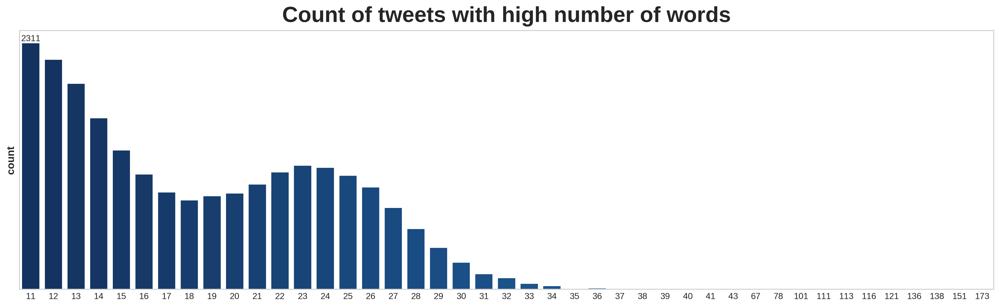

In [ ]:
# Set the size of the plot to 16x5 inches
plt.figure(figsize=(16, 5), dpi=300)
# Create a bar plot of 'text_len' for texts between 10 and 1000 words, using a reversed blue color palette
ax = sns.countplot(
    x="text_len",
    hue="text_len",
    legend=False,
    data=cyberbullying_df[(cyberbullying_df["text_len"] <= 1000) & (cyberbullying_df["text_len"] > 10)],
    palette="Blues_r",
)

# Add a title to the plot and set the font size to 25
plt.title("Count of tweets with high number of words", fontsize=25)
# Remove the y-axis tick labels
plt.yticks([])
# Add labels to the bars to show counts
ax.bar_label(ax.containers[0])
# Set the label of the y-axis to "count"
plt.ylabel("count")
# Remove the label from the x-axis
plt.xlabel("")
plt.savefig("higher_words_tweets_count.png")
plt.show()

<br></br>
### **Removing Long Tweets**

In [ ]:
# Let's remove tweets that are too long (with more than 100 words).
cyberbullying_df = cyberbullying_df[cyberbullying_df["text_len"] < cyberbullying_df["text_len"].quantile(0.995)]

<br></br>
#### **Get the length of the longest tweet since it will be useful later.**

In [ ]:
# Let's get the maximum length of tweets
max_length = np.max(cyberbullying_df["text_len"])
max_length

31

In [ ]:
# Let's sort the DataFrame by the 'text_len' column in descending order
cyberbullying_df.sort_values(by=["text_len"], ascending=False)

,text,sentiment,text_clean,text_len
22629,No need to fake it like The Sociopath Socialis...,religion,need fake like sociopath socialist margaret sa...,31
22393,Yeah right! Like Punjabi Pakistanis cutting th...,religion,yeah right like punjabi pakistani cutting balo...,31
22532,If something is bad then it is bad. Donnow wy ...,religion,something bad bad donnow wy people compare oth...,31
9849,FACT CHECK: *passion - since when does passion...,gender,fact check passion since passion give pas call...,31
45098,Goya black beans— more properly called frijole...,ethnicity,goya black bean properly called frijol negro d...,31
...,...,...,...,...
42252,ur the one who followed me first,ethnicity,one followed first,3
9680,bitch plz whatever,gender,bitch plz whatever,3
9520,@JacquesCuze @KimoiDoutei @aussielung Opt in s...,gender,opt solves problem,3
9439,Who is writing the bimbolines? #mkr,gender,writing bimbolines mkr,3


<br></br>
#### **Sentiment column encoding**

In [ ]:
cyberbullying_df["sentiment"] = cyberbullying_df["sentiment"].replace(
    {"religion": 0, "age": 1, "ethnicity": 2, "gender": 3, "not_cyberbullying": 4}
)

<br></br>
### **Train - Test split**

In [ ]:
# Let's assign the cleaned text data to variable X
X = cyberbullying_df["text_clean"]
# Let's assign the sentiment labels to variable y
y = cyberbullying_df["sentiment"]

In [ ]:
# Let's split the data into training and testing sets, maintaining the class distribution
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=seed_value
)

<br></br>
### **Train - Validation split**

In [ ]:
# Let's further split the training data into new training and validation sets, maintaining the class distribution
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed_value
)

In [ ]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 4967],
       [   2, 4711],
       [   3, 4622],
       [   4, 3882]])

<br></br>
**The classes are unbalanced, so it could be a good idea to oversample the training set such that all classes have the same count as the most populated one.**

<br></br>
### **Oversampling of training set**

In [ ]:
# Let's initialize the RandomOverSampler to handle class imbalance
ros = RandomOverSampler()

# Let's resample the X_train and y_train datasets to balance the classes
X_train, y_train = ros.fit_resample(
    np.array(X_train).reshape(-1, 1), np.array(y_train).reshape(-1, 1)
)

# Let's create a new DataFrame from the resampled data, labeling columns as 'text_clean' and 'sentiment'
train_os = pd.DataFrame(
    list(zip([x[0] for x in X_train], y_train)), columns=["text_clean", "sentiment"]
);

In [ ]:
# Let's extract the 'text_clean' column from the data_frame and assign it to X_train
X_train = train_os["text_clean"].values

# Let's extract the 'sentiment' column from the DataFrame and assign it to y_train
y_train = train_os["sentiment"].values

# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 5018],
       [   2, 5018],
       [   3, 5018],
       [   4, 5018]])

<br></br>
### **PyTorch LSTM RNN w/ Attention**

<br></br>
#### **Data preprocessing for LSTM**

In [ ]:
def Tokenize(column, seq_len):
    # Create a list of all words from the given text column
    corpus = [word for text in column for word in text.split()]
    # Count the frequency of each word in the corpus
    count_words = Counter(corpus)
    # Sort words by frequency in descending order
    sorted_words = count_words.most_common()
    # Create a dictionary mapping each word to a unique index based on frequency
    vocab_to_int = {w: i + 1 for i, (w, c) in enumerate(sorted_words)}

    # Convert the texts in the column to lists of indices based on the vocabulary
    text_int = []
    for text in column:
        r = [vocab_to_int[word] for word in text.split()]
        text_int.append(r)
    # Initialize an array to hold the tokenized text data with padding
    features = np.zeros((len(text_int), seq_len), dtype=int)
    for i, review in enumerate(text_int):
        if len(review) <= seq_len:
            zeros = list(np.zeros(seq_len - len(review)))  # Padding if the text is shorter than the maximum length
            new = zeros + review
        else:
            new = review[:seq_len]
        features[i, :] = np.array(new)
    return sorted_words, features  # Return the sorted vocabulary and the features array

In [ ]:
# Use the tokenize function to create a vocabulary and tokenize the "text_clean" column with a specified maximum length
vocabulary, tokenized_column = Tokenize(cyberbullying_df["text_clean"], max_length)

<br></br>
#### **Tokenizing one of the sample**

In [ ]:
# Let's tokenize one of the samples from train data
cyberbullying_df["text_clean"].iloc[0]

'word katandandre food crapilicious mkr'

<br></br>
#### **Vector transformation**

In [ ]:
# Let's get the transformed vector
tokenized_column[10]

array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,    11,  7696, 15536])

<br></br>
#### **TOP 20 most common words**

In [ ]:
# Let's initialize empty lists to store the top 20 keys and values separately
keys = []
values = []

# Loop through the first 20 key-value pairs in the vocabulary
for key, value in vocabulary[:20]:
    keys.append(key)  # Add the key to the keys list
    values.append(value)  # Add the value to the values list

<ipython-input-38-d0ab9e59b7c0>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=keys, y=values, palette="mako")


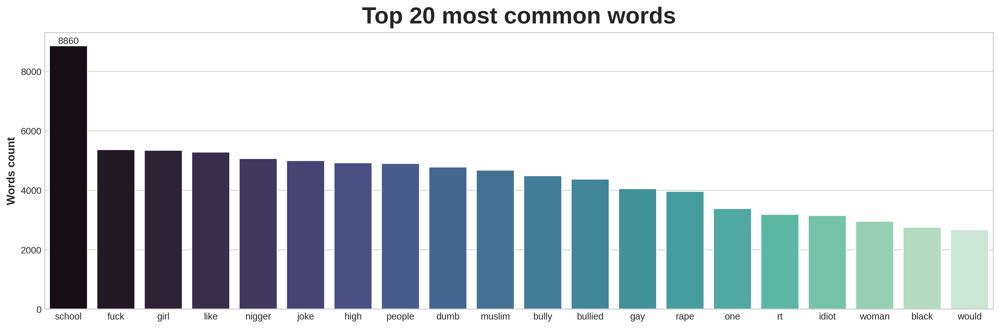

In [ ]:
# Set the size of the plot to 15x5 inches
plt.figure(figsize=(15, 5), dpi=300)

# Create a bar plot for the top 20 most common words using a Mako color palette
# Explicitly name the x and y parameters
ax = sns.barplot(x=keys, y=values, palette="mako")

# Set the title of the plot with a font size of 25
plt.title("Top 20 most common words", size=25)

# Display the word count on each bar
ax.bar_label(ax.containers[0])

# Set the label of the y-axis to "Words count"
plt.ylabel("Words count")
plt.savefig("top_words.png")
plt.show()

<br></br>
### **Word Embedding by Word2Vec**

In [ ]:
# Let's set a dimension of the embedding words, which can be seen as the number of featurs of each transformed word.
EMBEDDING_DIM = 200

# Let's split each string in X_train into a list of words to prepare data for Word2Vec training
Word2vec_train_data = list(map(lambda x: x.split(), X_train))

# Let's instaniate the Word2Vec model by passing the training words
word2vec_model = Word2Vec(Word2vec_train_data, vector_size=EMBEDDING_DIM)

# Let's define vocabulary size
print(f"Vocabulary size --> ", {len(vocabulary) + 1})
VOCAB_SIZE = len(vocabulary) + 1  # +1 for the padding

Vocabulary size -->  {37566}


In [ ]:
# Define an empty embedding matrix of shape (VOCAB_SIZE, EMBEDDING_DIM)
embedding_matrix = np.zeros((VOCAB_SIZE, EMBEDDING_DIM))

# Fill the embedding matrix with pre-trained values from word2vec
for word, token in vocabulary:
    # Check if the word is present in the word2vec model's vocabulary
    if word in word2vec_model.wv.key_to_index:
        # If the word is present, retrieve its embedding vector and add it to the embedding matrix
        embedding_vector = word2vec_model.wv[word]
        embedding_matrix[token] = embedding_vector

# Print the shape of the embedding matrix
print("Embedding Matrix Shape:", embedding_matrix.shape)

Embedding Matrix Shape: (37566, 200)


<br></br>
### **Train - Validation - Test split**

In [ ]:
# Let's assign the tokenized vector to variable X
X = tokenized_column
# Let's assign the sentiment labels to variable y
y = cyberbullying_df["sentiment"].values

In [ ]:
# Let's split the data into training and testing sets, maintaining the class distribution
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=seed_value
)

In [ ]:
# Let's further split the training data into new training and validation sets, maintaining the class distribution
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed_value
)

In [ ]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 4967],
       [   2, 4711],
       [   3, 4622],
       [   4, 3882]])

<br></br>
**The classes are unbalanced, so it could be a good idea to oversample the training set such that all classes have the same count as the most populated one.**

In [ ]:
# Let's initialize the RandomOverSampler to handle class imbalance
ros = RandomOverSampler()

# Let's resample the X_train and y_train datasets to balance the classes
X_train_os, y_train_os = ros.fit_resample(np.array(X_train), np.array(y_train))

In [ ]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train_os, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 5018],
       [   2, 5018],
       [   3, 5018],
       [   4, 5018]])

<br></br>
### **PyTorch datasets and dataloaders**

In [ ]:
# Set the size of each batch of data to be processed
BATCH_SIZE = 32

# Create Tensor datasets from the oversampled training data for use with PyTorch
train_data = TensorDataset(torch.from_numpy(X_train_os), torch.from_numpy(y_train_os))

# Create Tensor datasets from the testing data for use with PyTorch
test_data = TensorDataset(torch.from_numpy(X_test), torch.from_numpy(y_test))

# Create Tensor datasets from the validation data for use with PyTorch
valid_data = TensorDataset(torch.from_numpy(X_valid), torch.from_numpy(y_valid))

In [ ]:
# Create a DataLoader for the training set to shuffle data and organize it into batches
train_loader = DataLoader(
    train_data, shuffle=True, batch_size=BATCH_SIZE, drop_last=True
)

# Create a DataLoader for the validation set without shuffling, organized into batches
valid_loader = DataLoader(
    valid_data, shuffle=False, batch_size=BATCH_SIZE, drop_last=True
)

# Create a DataLoader for the test set without shuffling, organized into batches
test_loader = DataLoader(
    test_data, shuffle=False, batch_size=BATCH_SIZE, drop_last=True
)

<br></br>
### **PyTorch LSTM modeling with Attention Layer**

In [ ]:
class Attention(nn.Module):
    def __init__(self, hidden_dim, is_bidirectional):
        super(Attention, self).__init__()
        self.is_bidirectional = is_bidirectional
        # The attention linear layer which transforms the input data to the hidden space
        self.attn = nn.Linear(
            hidden_dim * (4 if is_bidirectional else 2),
            hidden_dim * (2 if is_bidirectional else 1),
        )
        # The linear layer that calculates the attention scores
        self.v = nn.Linear(hidden_dim * (2 if is_bidirectional else 1), 1, bias=False)

    def forward(self, hidden, encoder_outputs):
        seq_len = encoder_outputs.size(1)
        # Concatenate the last two hidden states in case of a bidirectional LSTM
        if self.is_bidirectional:
            hidden = torch.cat((hidden[-2], hidden[-1]), dim=-1)
        else:
            hidden = hidden[-1]
        # Repeat the hidden state across the sequence length
        hidden_repeated = hidden.unsqueeze(1).repeat(1, seq_len, 1)
        # Calculate attention weights
        attn_weights = torch.tanh(
            self.attn(torch.cat((hidden_repeated, encoder_outputs), dim=2))
        )
        # Compute attention scores
        attn_weights = self.v(attn_weights).squeeze(2)
        # Apply softmax to get valid probabilities
        return nn.functional.softmax(attn_weights, dim=1)


class LSTM_Sentiment_Classifier(nn.Module):
    def __init__(
        self,
        vocab_size,
        embedding_dim,
        hidden_dim,
        num_classes,
        lstm_layers,
        dropout,
        is_bidirectional,
    ):
        super(LSTM_Sentiment_Classifier, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = lstm_layers
        self.is_bidirectional = is_bidirectional

        # The Embedding layer that converts input words to embeddings
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        # LSTM layer which processes the embeddings
        self.lstm = nn.LSTM(
            embedding_dim,
            hidden_dim,
            lstm_layers,
            batch_first=True,
            bidirectional=is_bidirectional,
        )
        # Attention layer to compute the context vector
        self.attention = Attention(hidden_dim, is_bidirectional)
        # Fully connected layer which classifies the context vector into classes
        self.fc = nn.Linear(hidden_dim * (2 if is_bidirectional else 1), num_classes)
        # Apply LogSoftmax to outputs for numerical stability
        self.softmax = nn.LogSoftmax(dim=1)
        # Dropout layer for regularisation
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, hidden=None):
        if hidden is None:
            print(hidden)
            hidden = self.init_hidden(x.shape[0])

        # Transform words to embeddings
        embedded = self.embedding(x)
        # Pass embeddings to LSTM
        out, hidden = self.lstm(embedded, hidden)
        # Calculate attention weights
        attn_weights = self.attention(hidden[0], out)
        # Calculate context vector by taking the weighted sum of LSTM outputs
        context = attn_weights.unsqueeze(1).bmm(out).squeeze(1)
        # Classify the context vector
        out = self.softmax(self.fc(context))
        return out, hidden

    def init_hidden(self, batch_size):
        # Factor determines the size of hidden states depending on bidirectionality
        factor = 2 if self.is_bidirectional else 1
        # Initial hidden and cell states are zero
        h0 = torch.zeros(self.num_layers * factor, batch_size, self.hidden_dim).to(
            DEVICE
        )
        c0 = torch.zeros(self.num_layers * factor, batch_size, self.hidden_dim).to(
            DEVICE
        )
        return h0, c0

In [ ]:
NUM_CLASSES = 5  # We are dealing with a multiclass classification of 5 classes
HIDDEN_DIM = (
    100  # number of neurons of the internal state (internal neural network in the LSTM)
)
LSTM_LAYERS = 1  # Number of stacked LSTM layers

IS_BIDIRECTIONAL = (
    False  # Set this to False for unidirectional LSTM, and True for bidirectional LSTM
)

LR = 4e-4  # Learning rate
DROPOUT = 0.5  # LSTM Dropout
EPOCHS = 10  # Number of training epoch

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
# DEVICE = "cpu"


model = LSTM_Sentiment_Classifier(
    VOCAB_SIZE,
    EMBEDDING_DIM,
    HIDDEN_DIM,
    NUM_CLASSES,
    LSTM_LAYERS,
    DROPOUT,
    IS_BIDIRECTIONAL,
)

model = model.to(DEVICE)

# Initialize the embedding layer with the previously defined embedding matrix
model.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
# Allow the embedding matrix to be fine-tuned to better adapt to our dataset and get higher accuracy
model.embedding.weight.requires_grad = True

# Set up the criterion (loss function)
criterion = nn.NLLLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=5e-6)

# Let's print the configuration of model
model

LSTM_Sentiment_Classifier(
  (embedding): Embedding(37566, 200)
  (lstm): LSTM(200, 100, batch_first=True)
  (attention): Attention(
    (attn): Linear(in_features=200, out_features=100, bias=True)
    (v): Linear(in_features=100, out_features=1, bias=False)
  )
  (fc): Linear(in_features=100, out_features=5, bias=True)
  (softmax): LogSoftmax(dim=1)
  (dropout): Dropout(p=0.5, inplace=False)
)

<br></br>
### **LSTM Training loop**

In [ ]:
total_step = len(train_loader)
total_step_val = len(valid_loader)

early_stopping_patience = 4
early_stopping_counter = 0

valid_acc_max = 0  # Initialize best accuracy top 0

for e in range(EPOCHS):

    # lists to host the train and validation losses of every batch for each epoch
    train_loss, valid_loss = [], []
    # lists to host the train and validation accuracy of every batch for each epoch
    train_acc, valid_acc = [], []

    # lists to host the train and validation predictions of every batch for each epoch
    y_train_list, y_val_list = [], []

    # initalize number of total and correctly classified texts during training and validation
    correct, correct_val = 0, 0
    total, total_val = 0, 0
    running_loss, running_loss_val = 0, 0

    ####TRAINING LOOP####

    model.train()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(DEVICE), labels.to(
            DEVICE
        )  # load features and targets in device

        h = model.init_hidden(labels.size(0))

        model.zero_grad()  # reset gradients

        output, h = model(inputs, h)  # get output and hidden states from LSTM network

        loss = criterion(output, labels)
        loss.backward()

        running_loss += loss.item()

        optimizer.step()

        y_pred_train = torch.argmax(
            output, dim=1
        )  # get tensor of predicted values on the training set
        y_train_list.extend(
            y_pred_train.squeeze().tolist()
        )  # transform tensor to list and the values to the list

        correct += torch.sum(
            y_pred_train == labels
        ).item()  # count correctly classified texts per batch
        total += labels.size(0)  # count total texts per batch

    train_loss.append(running_loss / total_step)
    train_acc.append(100 * correct / total)

    ####VALIDATION LOOP####

    with torch.no_grad():

        model.eval()

        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

            val_h = model.init_hidden(labels.size(0))

            output, val_h = model(inputs, val_h)

            val_loss = criterion(output, labels)
            running_loss_val += val_loss.item()

            y_pred_val = torch.argmax(output, dim=1)
            y_val_list.extend(y_pred_val.squeeze().tolist())

            correct_val += torch.sum(y_pred_val == labels).item()
            total_val += labels.size(0)

        valid_loss.append(running_loss_val / total_step_val)
        valid_acc.append(100 * correct_val / total_val)

    # Save model if validation accuracy increases
    if np.mean(valid_acc) >= valid_acc_max:
        torch.save(model.state_dict(), "./state_dict.pt")
        print(
            f"Epoch {e+1}:Validation accuracy increased ({valid_acc_max:.6f} --> {np.mean(valid_acc):.6f}).  Saving model ..."
        )
        valid_acc_max = np.mean(valid_acc)
        early_stopping_counter = 0  # reset counter if validation accuracy increases
    else:
        print(f"Epoch {e+1}:Validation accuracy did not increase")
        early_stopping_counter += (
            1  # increase counter if validation accuracy does not increase
        )

    if early_stopping_counter > early_stopping_patience:
        print("Early stopped at epoch :", e + 1)
        break

    print(
        f"\tTrain_loss : {np.mean(train_loss):.4f} Val_loss : {np.mean(valid_loss):.4f}"
    )
    print(
        f"\tTrain_acc : {np.mean(train_acc):.3f}% Val_acc : {np.mean(valid_acc):.3f}%"
    )

Epoch 1:Validation accuracy increased (0.000000 --> 91.453729).  Saving model ...
	Train_loss : 0.6568 Val_loss : 0.2466
	Train_acc : 73.836% Val_acc : 91.454%
Epoch 2:Validation accuracy increased (91.453729 --> 92.731354).  Saving model ...
	Train_loss : 0.1734 Val_loss : 0.2231
	Train_acc : 94.372% Val_acc : 92.731%
Epoch 3:Validation accuracy increased (92.731354 --> 92.748619).  Saving model ...
	Train_loss : 0.0983 Val_loss : 0.2274
	Train_acc : 96.883% Val_acc : 92.749%
Epoch 4:Validation accuracy did not increase
	Train_loss : 0.0601 Val_loss : 0.2473
	Train_acc : 98.206% Val_acc : 92.248%
Epoch 5:Validation accuracy did not increase
	Train_loss : 0.0406 Val_loss : 0.2949
	Train_acc : 98.776% Val_acc : 92.058%
Epoch 6:Validation accuracy did not increase
	Train_loss : 0.0266 Val_loss : 0.3756
	Train_acc : 99.219% Val_acc : 90.228%
Epoch 7:Validation accuracy did not increase
	Train_loss : 0.0203 Val_loss : 0.3586
	Train_acc : 99.426% Val_acc : 91.367%
Epoch 8:Validation accurac

In [ ]:
# Loading the best model
model.load_state_dict(torch.load("./state_dict.pt"))

<All keys matched successfully>

<br></br>
### **LSTM Testing**

In [ ]:
def evaluate_model(model, test_loader):
    model.eval()
    y_pred_list = []
    y_test_list = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            test_h = model.init_hidden(labels.size(0))

            output, val_h = model(inputs, test_h)
            y_pred_test = torch.argmax(output, dim=1)
            y_pred_list.extend(y_pred_test.squeeze().tolist())
            y_test_list.extend(labels.squeeze().tolist())

    return y_pred_list, y_test_list


y_pred_list, y_test_list = evaluate_model(model, test_loader)

In [ ]:
classification_report_lstm = classification_report(y_test_list, y_pred_list, target_names=sentiments)
print(
    "Classification Report for Bi-LSTM :\n",
    classification_report_lstm,
)

Classification Report for Bi-LSTM :
               precision    recall  f1-score   support

    religion       0.93      0.95      0.94      1569
         age       0.97      0.98      0.98      1548
   ethnicity       0.98      0.98      0.98      1464
      gender       0.90      0.90      0.90      1442
not bullying       0.82      0.80      0.81      1209

    accuracy                           0.93      7232
   macro avg       0.92      0.92      0.92      7232
weighted avg       0.93      0.93      0.93      7232



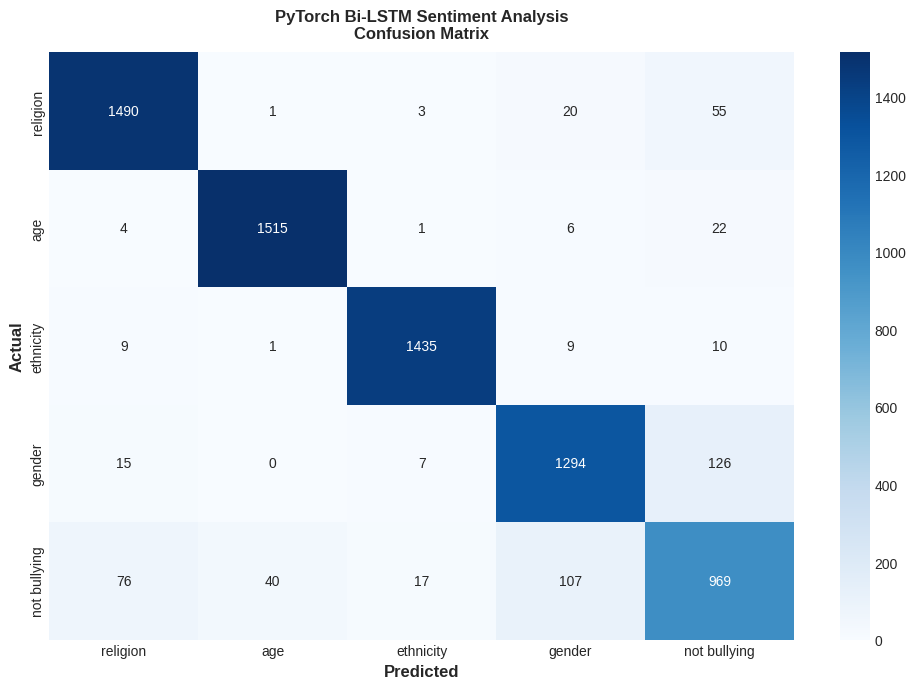

In [ ]:
cm = confusion_matrix(y_test_list, y_pred_list)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=sentiments, yticklabels=sentiments)
plt.title("PyTorch Bi-LSTM Sentiment Analysis\nConfusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

<br></br>
**The classification performance of the Bi-LSTM model is impressively high, achieving an overall accuracy of 93%. Notably, the F1-scores are particularly strong for well-represented classes, with "religion," "age," and "ethnicity" all exceeding 95%. These results indicate excellent precision and recall across these categories. The model also performs well in the "gender" and "not bullying" categories, though with slightly lower F1-scores of 89% and 82%, respectively. This comprehensive performance underscores the model's effectiveness in handling a range of sentiment classifications within the dataset.**

<br></br>
### **LIME Explainability**

In [ ]:
# Assuming you have the original texts in a DataFrame column
texts = cyberbullying_df["text_clean"].tolist()
labels = cyberbullying_df["sentiment"].tolist()

# Split the original texts alongside the tokenized versions
from sklearn.model_selection import train_test_split
X_train_texts, X_test_texts, y_train, y_test = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=seed_value
)

In [ ]:
def get_text_from_loader(dataloader, target_index):
    current_index = 0
    for batch in dataloader:
        # Assuming the DataLoader returns batches of inputs and labels
        inputs, labels = batch
        batch_size = inputs.size(0)

        # Check if the target index is in this batch
        if current_index <= target_index < current_index + batch_size:
            # Calculate the relative index of the target text within the batch
            relative_index = target_index - current_index

            # Extract the target text data
            target_text_data = inputs[relative_index]


            return target_text_data, labels[relative_index]

        # Update the index to account for the size of this batch
        current_index += batch_size

In [ ]:
explanation_index = 30
explanation_vector, explanation_label = get_text_from_loader(test_loader, explanation_index)
explanation_vector, explanation_label

(tensor([    0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,   180,  3005,  2242, 15806,
          2242]),
 tensor(4))

In [ ]:
def create_vocab_to_int(texts):
    # Create a corpus of all words
    corpus = [word for text in texts for word in text.split()]
    # Count the frequency of each word
    count_words = Counter(corpus)
    # Sort words by frequency
    sorted_words = count_words.most_common()
    # Create a dictionary mapping each word to a unique index
    vocab_to_int = {w: i + 1 for i, (w, c) in enumerate(sorted_words)}
    return vocab_to_int

def tokenize_and_pad(text, vocab_to_int, max_length):
    # Convert text to lowercase and tokenize based on vocab_to_int
    tokens = [vocab_to_int.get(word.lower(), vocab_to_int.get("<UNK>", 0)) for word in text.split()]
    padded = np.zeros(max_length, dtype=int)  # Create padding array
    # Pre-pad the tokens at the beginning if they are less than max_length
    padded[max_length - min(len(tokens), max_length):] = tokens[:max_length]
    return padded

# Let's define the vocabulary from training_data
vocab_to_int = create_vocab_to_int(cyberbullying_df['text_clean'].tolist())

In [ ]:
def predict_function(texts, model, vocab_to_int, max_length, device):
    model.eval()
    # Process texts
    inputs = torch.tensor(texts, dtype=torch.long).to(device)
    if inputs.dim() == 1:
        inputs = inputs.unsqueeze(0)
    with torch.no_grad():
        hidden = model.init_hidden(inputs.size(0))
        print(type(model.init_hidden))
        outputs, _ = model(inputs, hidden)
    probabilities = torch.softmax(outputs, dim=1).cpu().numpy()
    return probabilities

In [ ]:
def predict_proba(texts, model, vocab_to_int, max_length, device):
    model.eval()
    processed_texts = [tokenize_and_pad(text, vocab_to_int, max_length) for text in texts]
    inputs = torch.tensor(processed_texts, dtype=torch.long).to(device)

    with torch.no_grad():
        hidden = model.init_hidden(inputs.size(0))
        outputs, _ = model(inputs, hidden)
        probabilities = torch.softmax(outputs, dim=1).cpu().numpy()
    print(probabilities.shape)
    return probabilities

In [ ]:
# Let's instantiate the LIME explainer class with the suitable labels
explanation_index = 30
categories = {0: "religion", 1: "age", 2: "ethnicity", 3: "gender", 4: "not_cyberbullying"}
explainer = LimeTextExplainer(class_names=["religion", "age", "ethnicity", "gender", "not_cyberbullying"])

# Let's define a test instance and generate LIME explanations
text_instance = X_test_texts[explanation_index]

pred_probs = predict_function([X_test[explanation_index]], model, vocab_to_int, max_length, DEVICE)
print("Actual Label    : {}".format(categories[y_test[explanation_index]]))
print("Predicted Label : {}".format(categories[pred_probs.argmax(axis=1)[0]]))
print("Probability     : {:.3f}".format(pred_probs.max(axis=1)[0]))

explanation = explainer.explain_instance(
    text_instance,
    lambda x: predict_proba(x, model, vocab_to_int, max_length, DEVICE),
    num_features=10,
    num_samples=100,
    labels=[0, 1, 2, 3, 4]
)
print()
# print(explanation.as_list())
explanation.show_in_notebook(text=True)

<class 'method'>
Actual Label    : not_cyberbullying
Predicted Label : not_cyberbullying
Probability     : 0.925
(100, 5)



<ipython-input-60-d9c7eaaabc02>:4: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  inputs = torch.tensor(texts, dtype=torch.long).to(device)


<br></br>
#### **LIME Interpretability on Wrong Prediction**

In [ ]:
# Let's instantiate the LIME explainer class with the suitable labels
explanation_index = 42
categories = {0: "religion", 1: "age", 2: "ethnicity", 3: "gender", 4: "not_cyberbullying"}
explainer = LimeTextExplainer(class_names=["religion", "age", "ethnicity", "gender", "not_cyberbullying"])

# Let's define a test instance and generate LIME explanations
text_instance = X_test_texts[explanation_index]

pred_probs = predict_function([X_test[explanation_index]], model, vocab_to_int, max_length, DEVICE)
print("Actual Label    : {}".format(categories[y_test[explanation_index]]))
print("Predicted Label : {}".format(categories[pred_probs.argmax(axis=1)[0]]))
print("Probability     : {:.3f}".format(pred_probs.max(axis=1)[0]))

explanation = explainer.explain_instance(
    text_instance,
    lambda x: predict_proba(x, model, vocab_to_int, max_length, DEVICE),
    num_features=2,
    num_samples=5000,
    labels=[0, 1, 2, 3, 4]
)
print()
# print(explanation.as_list())
explanation.show_in_notebook(text=True)

<class 'method'>
Actual Label    : age
Predicted Label : age
Probability     : 0.995
(5000, 5)



<br></br>
### **BERT Classification**

In [ ]:
# Let's choose the Maximum length
MAX_LEN = 128

# Set the device to 'cuda' if GPU is available, otherwise set it to 'cpu'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Set the number of epochs for training to 2
EPOCHS = 2

<br></br>
#### **Train - Validation - Test split**

In [ ]:
# Let's assign the tokenized vector to variable X
X = cyberbullying_df['text_clean'].values
# Let's assign the sentiment labels to variable y
y = cyberbullying_df["sentiment"].values

In [ ]:
# Let's split the data into training and testing sets, maintaining the class distribution
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=seed_value
)

In [ ]:
# Let's further split the training data into new training and validation sets, maintaining the class distribution
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed_value
)

In [ ]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 4967],
       [   2, 4711],
       [   3, 4622],
       [   4, 3882]])

<br></br>
**The classes are unbalanced, so it could be a good idea to oversample the training set such that all classes have the same count as the most populated one.**

In [ ]:
# Let's initialize the RandomOverSampler to handle class imbalance
ros = RandomOverSampler()

# Let's resample the X_train and y_train datasets to balance the classes
X_train_os, y_train_os = ros.fit_resample(np.array(X_train).reshape(-1,1),np.array(y_train).reshape(-1,1))

In [ ]:
# Flatten the array X_train_os to a 1D array
X_train_os = X_train_os.flatten()

# Flatten the array y_train_os to a 1D array
y_train_os = y_train_os.flatten()

In [ ]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train_os, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 5018],
       [   2, 5018],
       [   3, 5018],
       [   4, 5018]])

<br></br>
### **BERT Tokenization**

In [ ]:
# Create a tokenizer object using the BERT tokenizer from the "bert-base-uncased" model,
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased", do_lower_case=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


<br></br>
#### **Custom Tokenizer**

In [ ]:
def bert_tokenizer(data):
    input_ids = []
    attention_masks = []
    for sent in data:
        encoded_sent = tokenizer.encode_plus(
            text=sent,
            add_special_tokens=True,        # Add `[CLS]` and `[SEP]` special tokens
            max_length=MAX_LEN,             # Choose max length to truncate/pad
            pad_to_max_length=True,         # Pad sentence to max length
            return_attention_mask=True      # Return attention mask
            )
        input_ids.append(encoded_sent.get('input_ids'))
        attention_masks.append(encoded_sent.get('attention_mask'))

    # Convert lists to tensors
    input_ids = torch.tensor(input_ids)
    attention_masks = torch.tensor(attention_masks)

    return input_ids, attention_masks

<br></br>
#### **Tokenizing Train Tweets**

In [ ]:
# Let's tokenize train tweets
encoded_tweets = [tokenizer.encode(sent, add_special_tokens=True) for sent in X_train]

# Find the longest tokenized tweet
max_len = max([len(sent) for sent in encoded_tweets])
print('Max length: ', max_len)

Max length:  82


In [ ]:
# Tokenize and create masks for the training data using the BERT tokenizer
train_inputs, train_masks = bert_tokenizer(X_train_os)

# Tokenize and create masks for the validation data using the BERT tokenizer
val_inputs, val_masks = bert_tokenizer(X_valid)

# Tokenize and create masks for the test data using the BERT tokenizer
test_inputs, test_masks = bert_tokenizer(X_test)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2674: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


<br></br>
### **Data preprocessing for PyTorch BERT model**

In [ ]:
# Convert the target columns of the training data to PyTorch tensors format
train_labels = torch.from_numpy(y_train_os)

# Convert the target columns of the validation data to PyTorch tensors format
val_labels = torch.from_numpy(y_valid)

# Convert the target columns of the test data to PyTorch tensors format
test_labels = torch.from_numpy(y_test)

<br></br>
### **Dataloaders**

In [ ]:
# Set the batch size for data loading
batch_size = 32

# Create a DataLoader for the training set using TensorDataset, RandomSampler, and specified batch size
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# Create a DataLoader for the validation set using TensorDataset, SequentialSampler, and specified batch size
val_data = TensorDataset(val_inputs, val_masks, val_labels)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler=val_sampler, batch_size=batch_size)

# Create a DataLoader for the test set using TensorDataset, SequentialSampler, and specified batch size
test_data = TensorDataset(test_inputs, test_masks, test_labels)
test_sampler = SequentialSampler(test_data)
test_dataloader = DataLoader(test_data, sampler=test_sampler, batch_size=batch_size)

<br></br>
### **BERT Modeling**

In [ ]:
class Bert_Classifier(nn.Module):
    def __init__(self, freeze_bert=False):
        super(Bert_Classifier, self).__init__()
        # Specify hidden size of BERT, hidden size of the classifier, and number of labels
        n_input = 768
        n_hidden = 50
        n_output = 5

        # Instantiate BERT model
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Instantiate the classifier (a fully connected layer followed by a ReLU activation and another fully connected layer)
        self.classifier = nn.Sequential(
            nn.Linear(n_input, n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden, n_output)
        )

        # Freeze the BERT model weights if freeze_bert is True (useful for feature extraction without fine-tuning)
        if freeze_bert:
            for param in self.bert.parameters():
                param.requires_grad = False

    def forward(self, inputs):
        input_ids, attention_mask = inputs
        # Feed input data (input_ids and attention_mask) to BERT
        outputs = self.bert(input_ids=input_ids,
                            attention_mask=attention_mask)

        # Extract the last hidden state of the `[CLS]` token from the BERT output (useful for classification tasks)
        last_hidden_state_cls = outputs[0][:, 0, :]

        # Feed the extracted hidden state to the classifier to compute logits
        logits = self.classifier(last_hidden_state_cls)

        return logits

In [ ]:
# Function for initializing the BERT Classifier model, optimizer, and learning rate scheduler
def initialize_model(epochs=4):
    # Instantiate Bert Classifier
    bert_classifier = Bert_Classifier(freeze_bert=False)

    bert_classifier.to(device)

    # Set up optimizer
    optimizer = AdamW(bert_classifier.parameters(),
                      lr=5e-5,    # learning rate, set to default value
                      eps=1e-8    # decay, set to default value
                      )

    # Calculate total number of training steps
    total_steps = len(train_dataloader) * epochs

    # Define the learning rate scheduler
    scheduler = get_linear_schedule_with_warmup(optimizer,
                                                num_warmup_steps=0, # Default value
                                                num_training_steps=total_steps)
    return bert_classifier, optimizer, scheduler

In [ ]:
# Let's intialize the BERT model calling the "initialize_model" function defined
bert_classifier, optimizer, scheduler = initialize_model(epochs=EPOCHS)

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:521: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


<br></br>
### **BERT Training**

In [157]:
# Define Cross entropy Loss function for the multiclass classification task
loss_fn = nn.CrossEntropyLoss()

def bert_train(model, train_dataloader, val_dataloader=None, epochs=4, evaluation=False):

    print("Start training...\n")
    for epoch_i in range(epochs):
        print("-"*10)
        print("Epoch : {}".format(epoch_i+1))
        print("-"*10)
        print("-"*38)
        print(f"{'BATCH NO.':^7} | {'TRAIN LOSS':^12} | {'ELAPSED (s)':^9}")
        print("-"*38)

        # Measure the elapsed time of each epoch
        t0_epoch, t0_batch = time.time(), time.time()

        # Reset tracking variables at the beginning of each epoch
        total_loss, batch_loss, batch_counts = 0, 0, 0

        ###TRAINING###

        # Put the model into the training mode
        model.train()

        for step, batch in enumerate(train_dataloader):
            batch_counts +=1

            b_input_ids, b_attn_mask, b_labels = tuple(t.to(device) for t in batch)

            # Zero out any previously calculated gradients
            model.zero_grad()

            # Perform a forward pass and get logits.
            logits = model((b_input_ids, b_attn_mask))

            # Compute loss and accumulate the loss values
            loss = loss_fn(logits, b_labels)
            batch_loss += loss.item()
            total_loss += loss.item()

            # Perform a backward pass to calculate gradients
            loss.backward()

            # Clip the norm of the gradients to 1.0 to prevent "exploding gradients"
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # Update model parameters:
            # fine tune BERT params and train additional dense layers
            optimizer.step()
            # update learning rate
            scheduler.step()

            # Print the loss values and time elapsed for every 100 batches
            if (step % 100 == 0 and step != 0) or (step == len(train_dataloader) - 1):
                # Calculate time elapsed for 20 batches
                time_elapsed = time.time() - t0_batch

                print(f"{step:^9} | {batch_loss / batch_counts:^12.6f} | {time_elapsed:^9.2f}")

                # Reset batch tracking variables
                batch_loss, batch_counts = 0, 0
                t0_batch = time.time()

        # Calculate the average loss over the entire training data
        avg_train_loss = total_loss / len(train_dataloader)

        ###EVALUATION###

        # Put the model into the evaluation mode
        model.eval()

        # Define empty lists to host accuracy and validation for each batch
        val_accuracy = []
        val_loss = []

        for batch in val_dataloader:
            batch_input_ids, batch_attention_mask, batch_labels = tuple(t.to(device) for t in batch)

            # We do not want to update the params during the evaluation,
            # So we specify that we dont want to compute the gradients of the tensors
            # by calling the torch.no_grad() method
            with torch.no_grad():
                logits = model((batch_input_ids, batch_attention_mask))

            loss = loss_fn(logits, batch_labels)

            val_loss.append(loss.item())

            # Get the predictions starting from the logits (get index of highest logit)
            preds = torch.argmax(logits, dim=1).flatten()

            # Calculate the validation accuracy
            accuracy = (preds == batch_labels).cpu().numpy().mean() * 100
            val_accuracy.append(accuracy)

        # Compute the average accuracy and loss over the validation set
        val_loss = np.mean(val_loss)
        val_accuracy = np.mean(val_accuracy)

        # Print performance over the entire training data
        time_elapsed = time.time() - t0_epoch
        print("-"*61)
        print(f"{'AVG TRAIN LOSS':^12} | {'VAL LOSS':^10} | {'VAL ACCURACY (%)':^9} | {'ELAPSED (s)':^9}")
        print("-"*61)
        print(f"{avg_train_loss:^14.6f} | {val_loss:^10.6f} | {val_accuracy:^17.2f} | {time_elapsed:^9.2f}")
        print("-"*61)
        print("\n")

    print("Training complete!")

In [158]:
# Let's finetune the bert model
bert_train(bert_classifier, train_dataloader, val_dataloader, epochs=EPOCHS)

Start training...

----------
Epoch : 1
----------
--------------------------------------
BATCH NO. |  TRAIN LOSS  | ELAPSED (s)
--------------------------------------
   100    |   0.074767   |   16.07  
   200    |   0.077619   |   15.86  
   300    |   0.076405   |   15.86  
   400    |   0.075905   |   15.87  
   500    |   0.069753   |   15.86  
   600    |   0.085019   |   15.88  
   700    |   0.069654   |   15.86  
   784    |   0.062826   |   13.23  
-------------------------------------------------------------
AVG TRAIN LOSS |  VAL LOSS  | VAL ACCURACY (%) | ELAPSED (s)
-------------------------------------------------------------
   0.074222    |  0.182053  |       94.55       |  133.61  
-------------------------------------------------------------


----------
Epoch : 2
----------
--------------------------------------
BATCH NO. |  TRAIN LOSS  | ELAPSED (s)
--------------------------------------
   100    |   0.086377   |   16.03  
   200    |   0.079956   |   15.88  
   3

In [ ]:
model_save_path = "./saved_models/cyberbullying_bert_model"
tokenizer_save_path = "./saved_models/cyberbullying_bert_model"

bert_classifier.bert.save_pretrained(model_save_path)
tokenizer.save_pretrained(tokenizer_save_path)
print(f"Model saved to {model_save_path}")
print(f"Tokenizer saved to {tokenizer_save_path}")

Model saved to ./saved_models/cyberbullying_bert_model
Tokenizer saved to ./saved_models/cyberbullying_bert_model


In [ ]:
# Specify the directory where your model and tokenizer are saved
model_save_path = "./saved_models/cyberbullying_bert_model"
tokenizer_save_path = "./saved_models/cyberbullying_bert_model"

# Load the trained model
cyberbullying_bert_model = BertModel.from_pretrained(model_save_path)

# Load the tokenizer
tokenizer = BertTokenizer.from_pretrained(tokenizer_save_path)

<br></br>
### **BERT Prediction**


In [159]:
def bert_predict(model, test_dataloader):

    # Define empty list to host the predictions
    preds_list = []

    # Put the model into evaluation mode
    model.eval()

    for batch in test_dataloader:
        batch_input_ids, batch_attention_mask = tuple(t.to(device) for t in batch)[:2]

        # Avoid gradient calculation of tensors by using "no_grad()" method
        with torch.no_grad():
            logit = model((batch_input_ids, batch_attention_mask))
        # print(logit)
        # Get index of highest logit
        pred = torch.argmax(logit, dim=1).cpu().numpy()
        # Append predicted class to list
        preds_list.extend(pred)
        # break

    return preds_list

In [160]:
# Generate predictions using the BERT classifier on the test data
cyberbullying_bert_model.to(device)
bert_preds = bert_predict(bert_classifier, test_dataloader)

In [161]:
# Print the classification report for BERT predictions
print('Classification Report for BERT :\n', classification_report(y_test, bert_preds, target_names=sentiments))

Classification Report for BERT :
               precision    recall  f1-score   support

    religion       0.96      0.96      0.96      1569
         age       0.99      0.98      0.99      1552
   ethnicity       0.99      0.99      0.99      1472
      gender       0.92      0.92      0.92      1445
not bullying       0.84      0.84      0.84      1213

    accuracy                           0.94      7251
   macro avg       0.94      0.94      0.94      7251
weighted avg       0.94      0.94      0.94      7251



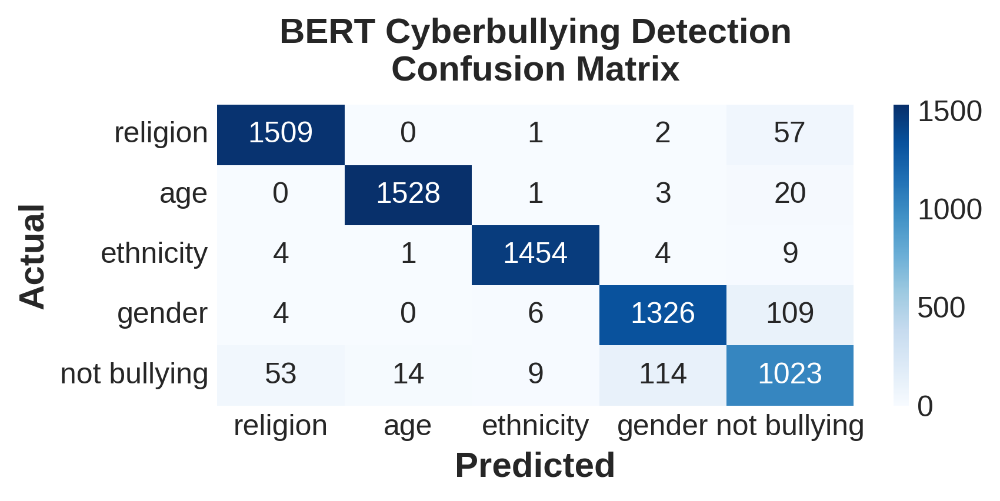

In [162]:
cm = confusion_matrix(y_test, bert_preds)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(6, 3), dpi=300)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=sentiments, yticklabels=sentiments)
plt.title("BERT Cyberbullying Detection\nConfusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

<br></br>
### **LIME Explainability**

In [ ]:
def predict_for_lime(texts, model):
    # Tokenize the text input for BERT
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # Make predictions
    with torch.no_grad():
        outputs = model((input_ids, attention_mask))
        probabilities = torch.nn.functional.softmax(outputs, dim=1)  # Assume outputs are the logits

    # Return probabilities in a format suitable for LIME
    return probabilities.cpu().numpy()

Actual Label    : gender
Predicted Label : gender
Probability     : 0.993






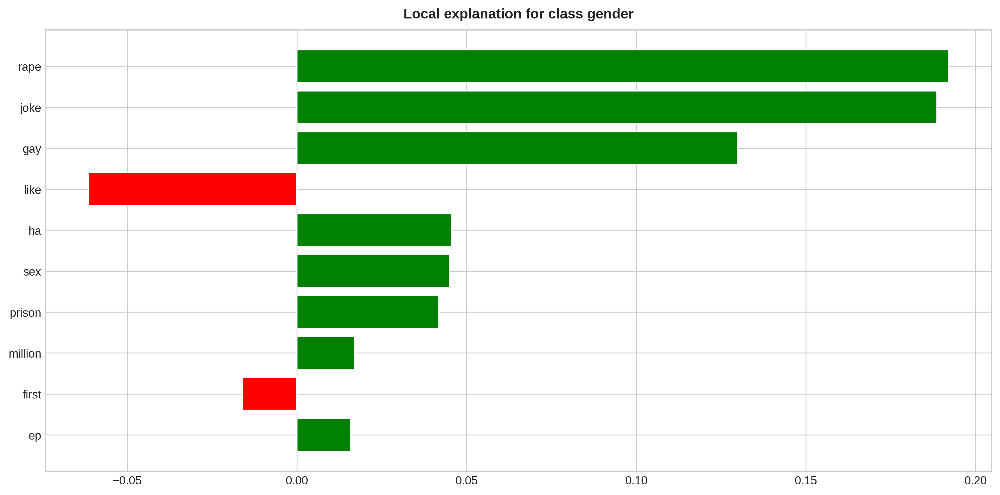

In [ ]:
plt.rcParams['figure.dpi'] = 300

# Instantiate the LIME explainer
explainer = LimeTextExplainer(class_names=["religion", "age", "ethnicity", "gender", "not_cyberbullying"])

# Define a test instance
explanation_index = 24
text_instance = X_test[explanation_index]

# Get the model's probability predictions for the test instance
pred_probs = predict_for_lime([text_instance], bert_classifier)
print("Actual Label    : {}".format(categories[y_test[explanation_index]]))
print("Predicted Label : {}".format(categories[pred_probs.argmax(axis=1)[0]]))
print("Probability     : {:.3f}".format(pred_probs.max(axis=1)[0]))
print()
print()
print()
print()

# Generate LIME explanation
explanation = explainer.explain_instance(
    text_instance,
    lambda x: predict_for_lime(x, bert_classifier),
    num_features=10,
    num_samples=500,  # May need to adjust based on the complexity of the model and the dataset
    labels=[0, 1, 2, 3, 4]
)

%matplotlib inline
fig = explanation.as_pyplot_figure(label=y_test[explanation_index])
fig.set_size_inches(12, 6)
fig.show()

# Display the explanation
explanation.show_in_notebook(text=True)
print()
print()
print()
print()

<br></br>
#### **LIME Interpretability on Wrong Prediction**

In [109]:
for i in range(len(X_test)):
    if "thing evil tiktok nurse" in X_test[i]:
        print(i)
        break

2277


Actual Label    : gender
Predicted Label : gender
Probability     : 0.992






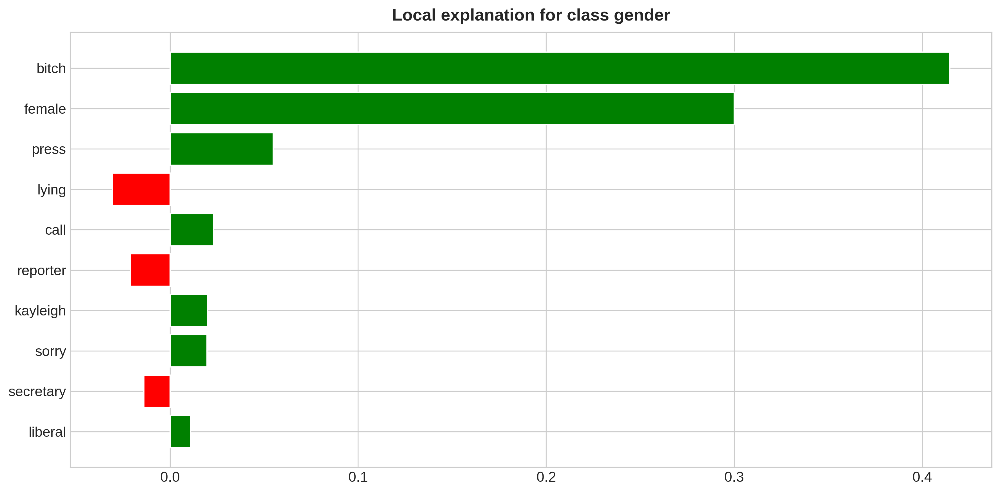

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams.update({'font.size': 12})

# Instantiate the LIME explainer
explainer = LimeTextExplainer(class_names=["religion", "age", "ethnicity", "gender", "not_cyberbullying"])

# Define a test instance
explanation_index = 32
text_instance = X_test[explanation_index]

# Get the model's probability predictions for the test instance
pred_probs = predict_for_lime([text_instance], bert_classifier)
print("Actual Label    : {}".format(categories[y_test[explanation_index]]))
print("Predicted Label : {}".format(categories[pred_probs.argmax(axis=1)[0]]))
print("Probability     : {:.3f}".format(pred_probs.max(axis=1)[0]))
print()
print()
print()
print()

# Generate LIME explanation
explanation = explainer.explain_instance(
    text_instance,
    lambda x: predict_for_lime(x, bert_classifier),
    num_features=10,
    num_samples=500,  # May need to adjust based on the complexity of the model and the dataset
    labels=[0, 1, 2, 3, 4]
)

%matplotlib inline
fig = explanation.as_pyplot_figure(label=pred_probs.argmax(axis=1)[0])
fig.set_size_inches(12, 6)

# Display the explanation
explanation.show_in_notebook(text=True)
print()
print()
print()
print()

<br></br>
### **Shap Explainability**

In [ ]:
# Let's empty the cache
torch.cuda.empty_cache()

In [ ]:
# Let's explore one of the train samples
print("Type of cleaned train sample --> ", type(X_train[0: 1]))
print()
print("Cleaned train sample         --> ", X_train[0:1])
print()
print("Output Labels                --> ", y_train[0: 2])

Type of cleaned train sample -->  <class 'numpy.ndarray'>

Cleaned train sample         -->  ['sign idiot loses argument throw around word racist miss point believe quran billion muslim history say slave trader need read instead brainwashed bbc news']

Output Labels                -->  [0 2]


<br></br>
### **Explanation for single sentence**

In [ ]:
def predict_for_shap(texts):
    texts = texts.tolist()

    # Tokenize the text input for BERT
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=MAX_LEN)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # Pass the tokenized text through the model and detach the output from the computation graph
    outputs = bert_classifier((input_ids, attention_mask))  # Get only the logits from the model's output

    probabilities = torch.nn.functional.softmax(outputs, dim=1)

    return outputs  # Return the logit values for further use in SHAP analysis

In [ ]:
# Initialize a SHAP Explainer object with the prediction function and tokenizer to prepare for generating explanations
explainer = shap.Explainer(predict_for_shap, tokenizer)

# Compute SHAP values for the first 10 training examples
shap_values = explainer(X_train[24:25])

In [ ]:
# Display a text-based visualization of SHAP values for the first prediction in the dataset
shap.plots.text(shap_values, grouping_threshold=10)

<br></br>
#### **Global Feature Importance**

In [ ]:
def predict_for_shap_bar(texts):
    texts = texts.tolist()

    # Tokenize the text input for BERT
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=MAX_LEN)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # Pass the tokenized text through the model and detach the output from the computation graph
    outputs = bert_classifier((input_ids, attention_mask)).detach().cpu().numpy()  # Get only the logits from the model's output

    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 0])  # use one vs rest logit units
    return val

In [ ]:
def predict_for_shap_test(texts):
    texts = texts.tolist()

    # Tokenize the text input for BERT
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=MAX_LEN)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # Pass the tokenized text through the model and detach the output from the computation graph
    outputs = bert_classifier((input_ids, attention_mask)).detach().cpu().numpy()  # Get only the logits from the model's output

    return outputs

In [ ]:
def make_predictor(index):
    def predict_for_shap_bar(texts):
        texts = texts.tolist()

        # Tokenize the text input for BERT
        inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=MAX_LEN)
        input_ids = inputs['input_ids'].to(device)
        attention_mask = inputs['attention_mask'].to(device)

        # Pass the tokenized text through the model and detach the output from the computation graph
        outputs = bert_classifier((input_ids, attention_mask)).detach().cpu().numpy()  # Get only the logits from the model's output

        scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
        val = sp.special.logit(scores[:, index])  # use logit for specified class index
        return val

    return predict_for_shap_bar

<br></br>
#### **The most important feature words correspond to the label "religion."**

In [ ]:
index_for_religion = 0
custom_predictor = make_predictor(index_for_religion)

# Initialize a SHAP Explainer object with the custom prediction function
religion_explainer = shap.Explainer(custom_predictor, tokenizer)

# Compute SHAP values for the first 10 training examples
religion_shap_values = religion_explainer(X_train[:2000])

PartitionExplainer explainer: 2001it [27:53,  1.19it/s]


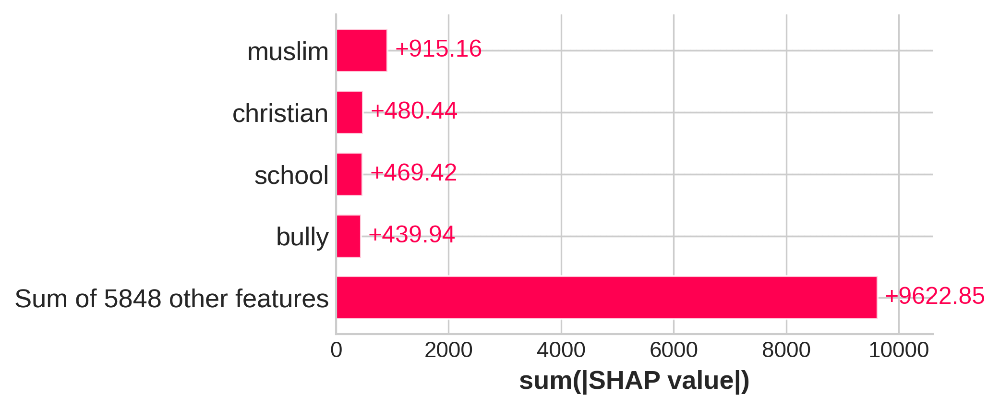

In [ ]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(7, 3), dpi=300)

# Create the SHAP bar plot and pass the matplotlib axis object
shap.plots.bar(religion_shap_values.abs.sum(0), ax=ax, max_display=5)

<br></br>
#### **The most important feature words correspond to the label "age."**

In [ ]:
index_for_age = 1
custom_predictor = make_predictor(index_for_age)

# Initialize a SHAP Explainer object with the custom prediction function
age_explainer = shap.Explainer(custom_predictor, tokenizer)

# Compute SHAP values for the first 10 training examples
age_shap_values = age_explainer(X_train[:2000])

PartitionExplainer explainer: 2001it [27:48,  1.19it/s]


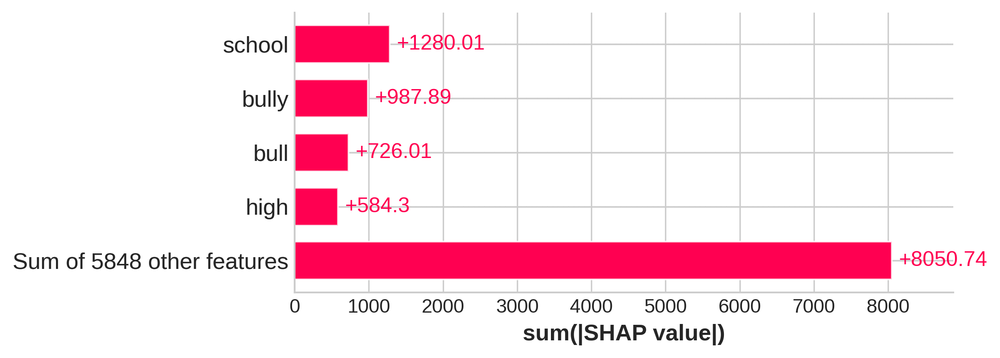

In [105]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(8, 3), dpi=300)

# Create the SHAP bar plot and pass the matplotlib axis object
shap.plots.bar(age_shap_values.abs.sum(0), ax=ax, max_display=5)

<br></br>
#### **The most important feature words correspond to the label "ethnicity."**

In [173]:
index_for_ethnicity = 2
custom_predictor = make_predictor(index_for_ethnicity)

# Initialize a SHAP Explainer object with the custom prediction function
ethnicity_explainer = shap.Explainer(custom_predictor, tokenizer)

# Compute SHAP values for the first 10 training examples
ethnicity_shap_values = ethnicity_explainer(X_train[:2000])

PartitionExplainer explainer: 2001it [27:46,  1.19it/s]


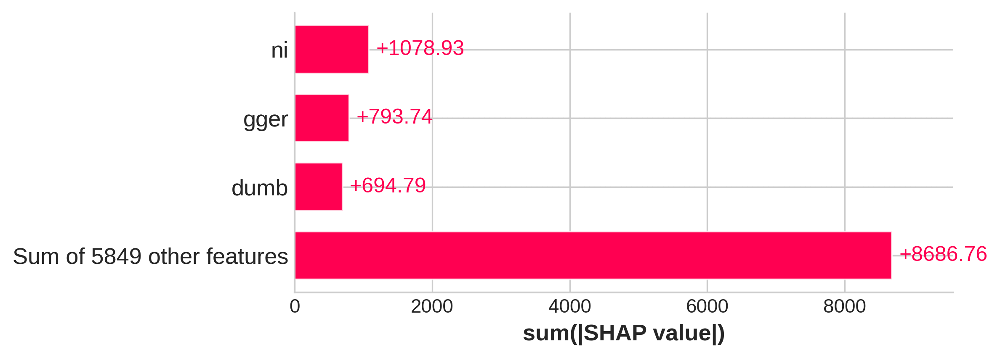

In [174]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(8, 3), dpi=300)

# Create the SHAP bar plot and pass the matplotlib axis object
shap.plots.bar(ethnicity_shap_values.abs.sum(0), ax=ax, max_display=4)

<br></br>
#### **The most important feature words correspond to the label "gender."**

In [175]:
index_for_gender = 3
custom_predictor = make_predictor(index_for_gender)

# Initialize a SHAP Explainer object with the custom prediction function
gender_explainer = shap.Explainer(custom_predictor, tokenizer)

# Compute SHAP values for the first 10 training examples
gender_shap_values = gender_explainer(X_train[:2000])

PartitionExplainer explainer: 2001it [27:51,  1.19it/s]


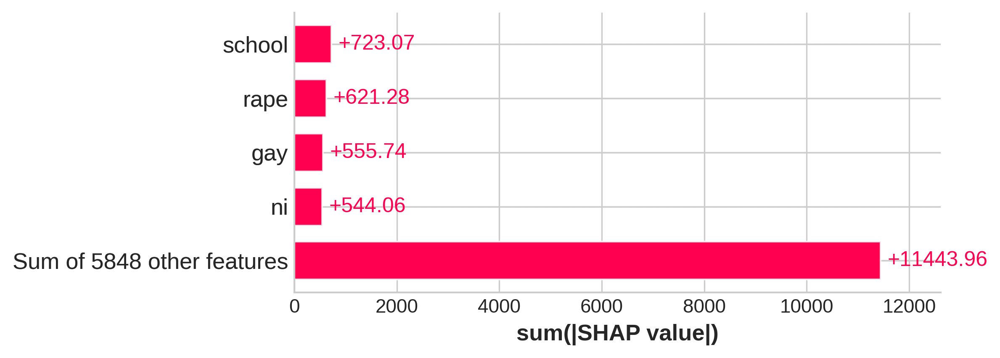

In [176]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(8, 3), dpi=300)

# Create the SHAP bar plot and pass the matplotlib axis object
shap.plots.bar(gender_shap_values.abs.sum(0), ax=ax, max_display=5)

<br></br>
#### **The most important feature words correspond to the label "not cyberbullying."**

In [177]:
index_for_not_cyberbullying = 4
custom_predictor = make_predictor(index_for_not_cyberbullying)

# Initialize a SHAP Explainer object with the custom prediction function
not_cyberbullying_explainer = shap.Explainer(custom_predictor, tokenizer)

# Compute SHAP values for the first 10 training examples
not_cyberbullying_shap_values = not_cyberbullying_explainer(X_train[:2000])

PartitionExplainer explainer: 2001it [27:35,  1.20it/s]


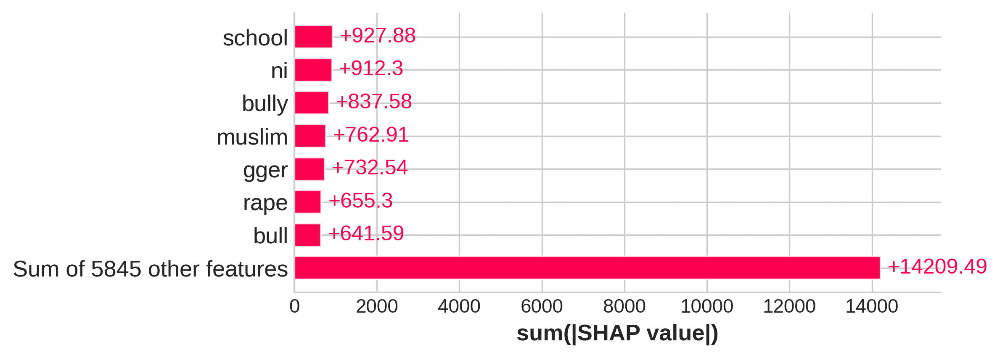

In [178]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(8, 3), dpi=300)

# Create the SHAP bar plot and pass the matplotlib axis object
shap.plots.bar(not_cyberbullying_shap_values.abs.sum(0), ax=ax, max_display=8)

<br></br>
### **Integrated Gradients**

------
#### We need to split forward pass into two part:
1. embeddings computation
1. classification

In [129]:
explanation_index = 0
model = bert_classifier
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# We need to split forward pass into two part:
# 1) embeddings computation
# 2) classification

def compute_bert_outputs(model_bert, embedding_output, attention_mask=None, head_mask=None):
    if attention_mask is None:
        attention_mask = torch.ones(embedding_output.shape[0], embedding_output.shape[1]).to(embedding_output)

    extended_attention_mask = attention_mask.unsqueeze(1).unsqueeze(2)

    extended_attention_mask = extended_attention_mask.to(dtype=next(model_bert.parameters()).dtype) # fp16 compatibility
    extended_attention_mask = (1.0 - extended_attention_mask) * -10000.0

    if head_mask is not None:
        if head_mask.dim() == 1:
            head_mask = head_mask.unsqueeze(0).unsqueeze(0).unsqueeze(-1).unsqueeze(-1)
            head_mask = head_mask.expand(model_bert.config.num_hidden_layers, -1, -1, -1, -1)
        elif head_mask.dim() == 2:
            head_mask = head_mask.unsqueeze(1).unsqueeze(-1).unsqueeze(-1)  # We can specify head_mask for each layer
        head_mask = head_mask.to(dtype=next(model_bert.parameters()).dtype) # switch to fload if need + fp16 compatibility
    else:
        head_mask = [None] * model_bert.config.num_hidden_layers

    encoder_outputs = model_bert.encoder(embedding_output,
                                         extended_attention_mask,
                                         head_mask=head_mask)
    sequence_output = encoder_outputs[0]
    pooled_output = model_bert.pooler(sequence_output)
    outputs = (sequence_output, pooled_output,) + encoder_outputs[1:]  # add hidden_states and attentions if they are here
    return outputs  # sequence_output, pooled_output, (hidden_states), (attentions)


class BertModelWrapper(nn.Module):

    def __init__(self, model):
        super(BertModelWrapper, self).__init__()
        self.model = model

    def forward(self, embeddings):
        outputs = compute_bert_outputs(self.model.bert, embeddings)
        pooled_output = outputs[1]  # Extract the pooled output tensor (usually at index 1)
        # pooled_output = self.model.dropout(pooled_output)  # Apply any required dropout
        logits = self.model.classifier(pooled_output)  # Pass the tensor to the classifier layer
        # return torch.softmax(logits, dim=1)[:, 2].unsqueeze(1)
        return torch.softmax(logits, dim=1)
        # return outputs

bert_model_wrapper = BertModelWrapper(model)
ig = IntegratedGradients(bert_model_wrapper)

# accumalate couple samples in this array for visualization purposes
vis_data_records_ig = []

# Update the interpret_sentence function to move tensors to the same device as the model
def interpret_sentence(model_wrapper, sentence, label=1):
    model_wrapper.eval()
    model_wrapper.zero_grad()

    # Tokenize and move input IDs to the device
    input_ids = torch.tensor([tokenizer.encode(sentence, add_special_tokens=True, max_length=MAX_LEN, truncation=True)], device=device)
    input_embedding = model_wrapper.model.bert.embeddings(input_ids)

    # Ensure the model is on the same device
    model_wrapper.to(device)

    # Predict using the model wrapper
    # pred = model_wrapper(input_embedding).detach().cpu().numpy()
    # print("--->", pred.shape, pred[0][0])
    # pred_ind = round(pred)
    preds = model_wrapper(input_embedding).detach().cpu().numpy()
    # print("shape", preds.shape, preds)
    pred_ind = int(preds.argmax())  # Index of the predicted class
    pred = preds[0][pred_ind]

    # Compute attributions using Integrated Gradients
    # attributions_ig, delta = ig.attribute(input_embedding, n_steps=500, return_convergence_delta=True)
    attributions_ig, delta = ig.attribute(input_embedding, target=pred_ind, n_steps=100, return_convergence_delta=True)
    print('pred: ', pred_ind, '(', '%.2f' % pred, ')', ', delta: ', abs(delta))

    tokens = tokenizer.convert_ids_to_tokens(input_ids.cpu().numpy().flatten().tolist())
    add_attributions_to_visualizer(attributions_ig, tokens, pred, pred_ind, label, delta, vis_data_records_ig)



def add_attributions_to_visualizer(attributions, tokens, pred, pred_ind, label, delta, vis_data_records):
    attributions = attributions.sum(dim=2).squeeze(0)
    attributions = attributions / torch.norm(attributions)
    attributions = attributions.detach().cpu().numpy()

    # storing couple samples in an array for visualization purposes
    vis_data_records.append(visualization.VisualizationDataRecord(
                            attributions,
                            pred,
                            pred_ind,
                            label,
                            "label",
                            attributions.sum(),
                            tokens[:len(attributions)],
                            delta))

interpret_sentence(bert_model_wrapper, sentence=X_test[1], label=y_test[1])
_ = visualization.visualize_text(vis_data_records_ig)

pred:  4 ( 0.22 ) , delta:  tensor([0.0010], device='cuda:0', dtype=torch.float64)


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
1,4 (0.22),label,0.75,[CLS] help child deal school bully bullying school [SEP]


<br></br>
<br></br>
### **Similarity Analysis**

----
**The dataset contains five labels, with the following counts reflecting their actual distribution prior to any pre-processing. For model fine-tuning and predictions, the data was oversampled and training occurred using this augmented set. Analyzing the similarity between the weights of the final layer offers insight into the impact of oversampling on the model’s training.**


| **Label** | **Count** |
|-----------|-----------|
| Religion         | 5016      |
| Age         | 4968      |
| Ethnicity        | 4716      |
| Gender         | 4629      |
| Not Cyberbullying         | 3887      |


<br></br>
<br></br>


In [130]:
# Let's assign the tokenized vector to variable X
X_similarity = cyberbullying_df['text_clean'].values
# Let's assign the sentiment labels to variable y
y_similarity = cyberbullying_df["sentiment"].values

In [131]:
# Let's split the data into training and testing sets, maintaining the class distribution
X_train_similarity, X_test_similarity, y_train_similarity, y_test_similarity = train_test_split(
    X_similarity, y_similarity, test_size=0.2, stratify=y, random_state=seed_value
)

In [132]:
# Let's further split the training data into new training and validation sets, maintaining the class distribution
X_train_similarity, X_valid_similarity, y_train_similarity, y_valid_similarity = train_test_split(
    X_train_similarity, y_train_similarity, test_size=0.2, stratify=y_train_similarity, random_state=seed_value
)

In [133]:
# Let's calculate the unique values and their counts in the y_train dataset
(unique, counts) = np.unique(y_train_similarity, return_counts=True)

# Let's combine the unique values and transpose it for better readability
np.asarray((unique, counts)).T

array([[   0, 5018],
       [   1, 4967],
       [   2, 4711],
       [   3, 4622],
       [   4, 3882]])

<br></br>
### **BERT Tokenization**

In [134]:
# Create a tokenizer object using the BERT tokenizer from the "bert-base-uncased" model,
tokenizer_similarity = BertTokenizer.from_pretrained("bert-base-uncased", do_lower_case=True)

<br></br>
#### **Custom Tokenizer**

In [135]:
def bert_tokenizer(data):
    input_ids = []
    attention_masks = []
    for sent in data:
        encoded_sent = tokenizer.encode_plus(
            text=sent,
            add_special_tokens=True,        # Add `[CLS]` and `[SEP]` special tokens
            max_length=MAX_LEN,             # Choose max length to truncate/pad
            pad_to_max_length=True,         # Pad sentence to max length
            return_attention_mask=True      # Return attention mask
            )
        input_ids.append(encoded_sent.get('input_ids'))
        attention_masks.append(encoded_sent.get('attention_mask'))

    # Convert lists to tensors
    input_ids = torch.tensor(input_ids)
    attention_masks = torch.tensor(attention_masks)

    return input_ids, attention_masks

<br></br>
#### **Tokenizing Train Tweets**

In [136]:
# Let's tokenize train tweets
encoded_tweets = [tokenizer_similarity.encode(sent, add_special_tokens=True) for sent in X_train_similarity]

# Find the longest tokenized tweet
max_len = max([len(sent) for sent in encoded_tweets])
print('Max length: ', max_len)

Max length:  82


In [137]:
# Tokenize and create masks for the training data using the BERT tokenizer
train_inputs_similarity, train_masks_similarity = bert_tokenizer(X_train_similarity)

# Tokenize and create masks for the validation data using the BERT tokenizer
val_inputs_similarity, val_masks_similarity = bert_tokenizer(X_valid_similarity)

# Tokenize and create masks for the test data using the BERT tokenizer
test_inputs_similarity, test_masks_similarity = bert_tokenizer(X_test_similarity)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2674: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


<br></br>
### **Data preprocessing for PyTorch BERT model**

In [138]:
# Convert the target columns of the training data to PyTorch tensors format
train_labels_similarity = torch.from_numpy(y_train_similarity)

# Convert the target columns of the validation data to PyTorch tensors format
val_labels_similarity = torch.from_numpy(y_valid_similarity)

# Convert the target columns of the test data to PyTorch tensors format
test_labels_similarity = torch.from_numpy(y_test_similarity)

<br></br>
### **Dataloaders**

In [139]:
# Set the batch size for data loading
batch_size = 32

# Create a DataLoader for the training set using TensorDataset, RandomSampler, and specified batch size
train_data_similarity = TensorDataset(train_inputs_similarity, train_masks_similarity, train_labels_similarity)
train_sampler_similarity = RandomSampler(train_data_similarity)
train_dataloader_similarity = DataLoader(train_data_similarity, sampler=train_sampler_similarity, batch_size=batch_size)

# Create a DataLoader for the validation set using TensorDataset, SequentialSampler, and specified batch size
val_data_similarity = TensorDataset(val_inputs_similarity, val_masks_similarity, val_labels_similarity)
val_sampler_similarity = SequentialSampler(val_data_similarity)
val_dataloader_similarity = DataLoader(val_data_similarity, sampler=val_sampler_similarity, batch_size=batch_size)

# Create a DataLoader for the test set using TensorDataset, SequentialSampler, and specified batch size
test_data_similarity = TensorDataset(test_inputs_similarity, test_masks_similarity, test_labels_similarity)
test_sampler_similarity = SequentialSampler(test_data)
test_dataloader_similarity = DataLoader(test_data_similarity, sampler=test_sampler_similarity, batch_size=batch_size)

<br></br>
### **BERT Modeling**

In [140]:
class Bert_Classifier_Similarity(nn.Module):
    def __init__(self, freeze_bert=False):
        super(Bert_Classifier_Similarity, self).__init__()
        # Specify hidden size of BERT, hidden size of the classifier, and number of labels
        n_input = 768
        n_hidden = 50
        n_output = 5

        # Instantiate BERT model
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Instantiate the classifier (a fully connected layer followed by a ReLU activation and another fully connected layer)
        self.classifier = nn.Sequential(
            nn.Linear(n_input, n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden, n_output)
        )

        # Freeze the BERT model weights if freeze_bert is True (useful for feature extraction without fine-tuning)
        if freeze_bert:
            for param in self.bert.parameters():
                param.requires_grad = False

    def forward(self, inputs):
        input_ids, attention_mask = inputs
        # Feed input data (input_ids and attention_mask) to BERT
        outputs = self.bert(input_ids=input_ids,
                            attention_mask=attention_mask)

        # Extract the last hidden state of the `[CLS]` token from the BERT output (useful for classification tasks)
        last_hidden_state_cls = outputs[0][:, 0, :]

        # Feed the extracted hidden state to the classifier to compute logits
        logits = self.classifier(last_hidden_state_cls)

        return logits

In [141]:
# Function for initializing the BERT Classifier model, optimizer, and learning rate scheduler
def initialize_model(epochs=4):
    # Instantiate Bert Classifier
    bert_classifier_similarity = Bert_Classifier_Similarity(freeze_bert=False)

    bert_classifier_similarity.to(device)

    # Set up optimizer
    optimizer = AdamW(bert_classifier_similarity.parameters(),
                      lr=5e-5,    # learning rate, set to default value
                      eps=1e-8    # decay, set to default value
                      )

    # Calculate total number of training steps
    total_steps = len(train_dataloader_similarity) * epochs

    # Define the learning rate scheduler
    scheduler = get_linear_schedule_with_warmup(optimizer,
                                                num_warmup_steps=0, # Default value
                                                num_training_steps=total_steps)
    return bert_classifier_similarity, optimizer, scheduler

In [142]:
# Let's intialize the BERT model calling the "initialize_model" function defined
bert_classifier_similarity, optimizer, scheduler = initialize_model(epochs=EPOCHS)

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:521: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


<br></br>
### **BERT Training**

In [143]:
# Define Cross entropy Loss function for the multiclass classification task
loss_fn = nn.CrossEntropyLoss()

def bert_train(model, train_dataloader_similarity, val_dataloader_similarity=None, epochs=4, evaluation=False):

    print("Start training...\n")
    for epoch_i in range(epochs):
        print("-"*10)
        print("Epoch : {}".format(epoch_i+1))
        print("-"*10)
        print("-"*38)
        print(f"{'BATCH NO.':^7} | {'TRAIN LOSS':^12} | {'ELAPSED (s)':^9}")
        print("-"*38)

        # Measure the elapsed time of each epoch
        t0_epoch, t0_batch = time.time(), time.time()

        # Reset tracking variables at the beginning of each epoch
        total_loss, batch_loss, batch_counts = 0, 0, 0

        ###TRAINING###

        # Put the model into the training mode
        model.train()

        for step, batch in enumerate(train_dataloader_similarity):
            batch_counts +=1

            b_input_ids, b_attn_mask, b_labels = tuple(t.to(device) for t in batch)

            # Zero out any previously calculated gradients
            model.zero_grad()

            # Perform a forward pass and get logits.
            logits = model((b_input_ids, b_attn_mask))

            # Compute loss and accumulate the loss values
            loss = loss_fn(logits, b_labels)
            batch_loss += loss.item()
            total_loss += loss.item()

            # Perform a backward pass to calculate gradients
            loss.backward()

            # Clip the norm of the gradients to 1.0 to prevent "exploding gradients"
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # Update model parameters:
            # fine tune BERT params and train additional dense layers
            optimizer.step()
            # update learning rate
            scheduler.step()

            # Print the loss values and time elapsed for every 100 batches
            if (step % 100 == 0 and step != 0) or (step == len(train_dataloader) - 1):
                # Calculate time elapsed for 20 batches
                time_elapsed = time.time() - t0_batch

                print(f"{step:^9} | {batch_loss / batch_counts:^12.6f} | {time_elapsed:^9.2f}")

                # Reset batch tracking variables
                batch_loss, batch_counts = 0, 0
                t0_batch = time.time()

        # Calculate the average loss over the entire training data
        avg_train_loss = total_loss / len(train_dataloader)

        ###EVALUATION###

        # Put the model into the evaluation mode
        model.eval()

        # Define empty lists to host accuracy and validation for each batch
        val_accuracy = []
        val_loss = []

        for batch in val_dataloader_similarity:
            batch_input_ids, batch_attention_mask, batch_labels = tuple(t.to(device) for t in batch)

            # We do not want to update the params during the evaluation,
            # So we specify that we dont want to compute the gradients of the tensors
            # by calling the torch.no_grad() method
            with torch.no_grad():
                logits = model((batch_input_ids, batch_attention_mask))

            loss = loss_fn(logits, batch_labels)

            val_loss.append(loss.item())

            # Get the predictions starting from the logits (get index of highest logit)
            preds = torch.argmax(logits, dim=1).flatten()

            # Calculate the validation accuracy
            accuracy = (preds == batch_labels).cpu().numpy().mean() * 100
            val_accuracy.append(accuracy)

        # Compute the average accuracy and loss over the validation set
        val_loss = np.mean(val_loss)
        val_accuracy = np.mean(val_accuracy)

        # Print performance over the entire training data
        time_elapsed = time.time() - t0_epoch
        print("-"*61)
        print(f"{'AVG TRAIN LOSS':^12} | {'VAL LOSS':^10} | {'VAL ACCURACY (%)':^9} | {'ELAPSED (s)':^9}")
        print("-"*61)
        print(f"{avg_train_loss:^14.6f} | {val_loss:^10.6f} | {val_accuracy:^17.2f} | {time_elapsed:^9.2f}")
        print("-"*61)
        print("\n")

    print("Training complete!")

In [144]:
# Let's finetune the bert model
bert_train(bert_classifier_similarity, train_dataloader_similarity, val_dataloader_similarity, epochs=EPOCHS)

Start training...

----------
Epoch : 1
----------
--------------------------------------
BATCH NO. |  TRAIN LOSS  | ELAPSED (s)
--------------------------------------
   100    |   0.576632   |   16.10  
   200    |   0.268345   |   15.86  
   300    |   0.232032   |   15.88  
   400    |   0.205779   |   15.88  
   500    |   0.205059   |   15.87  
   600    |   0.199458   |   15.87  
   700    |   0.188639   |   15.86  
-------------------------------------------------------------
AVG TRAIN LOSS |  VAL LOSS  | VAL ACCURACY (%) | ELAPSED (s)
-------------------------------------------------------------
   0.244848    |  0.194170  |       93.42       |  124.24  
-------------------------------------------------------------


----------
Epoch : 2
----------
--------------------------------------
BATCH NO. |  TRAIN LOSS  | ELAPSED (s)
--------------------------------------
   100    |   0.133975   |   16.03  
   200    |   0.142905   |   15.87  
   300    |   0.132041   |   15.87  
   4

<br></br>
### **BERT Prediction**


In [145]:
def bert_predict(model, test_dataloader):

    # Define empty list to host the predictions
    preds_list = []

    # Put the model into evaluation mode
    model.eval()

    for batch in test_dataloader:
        batch_input_ids, batch_attention_mask = tuple(t.to(device) for t in batch)[:2]

        # Avoid gradient calculation of tensors by using "no_grad()" method
        with torch.no_grad():
            logit = model((batch_input_ids, batch_attention_mask))
        # print(logit)
        # Get index of highest logit
        pred = torch.argmax(logit, dim=1).cpu().numpy()
        # Append predicted class to list
        preds_list.extend(pred)
        # break

    return preds_list

In [146]:
# Generate predictions using the BERT classifier on the test data
# cyberbullying_bert_model.to(device)
bert_preds_similarity = bert_predict(bert_classifier_similarity, test_dataloader_similarity)

In [147]:
# Print the classification report for BERT predictions
print('Classification Report for BERT :\n', classification_report(y_test_similarity, bert_preds_similarity, target_names=sentiments))

Classification Report for BERT :
               precision    recall  f1-score   support

    religion       0.96      0.97      0.96      1569
         age       0.99      0.98      0.99      1552
   ethnicity       0.99      0.99      0.99      1472
      gender       0.93      0.91      0.92      1445
not bullying       0.84      0.86      0.85      1213

    accuracy                           0.95      7251
   macro avg       0.94      0.94      0.94      7251
weighted avg       0.95      0.95      0.95      7251



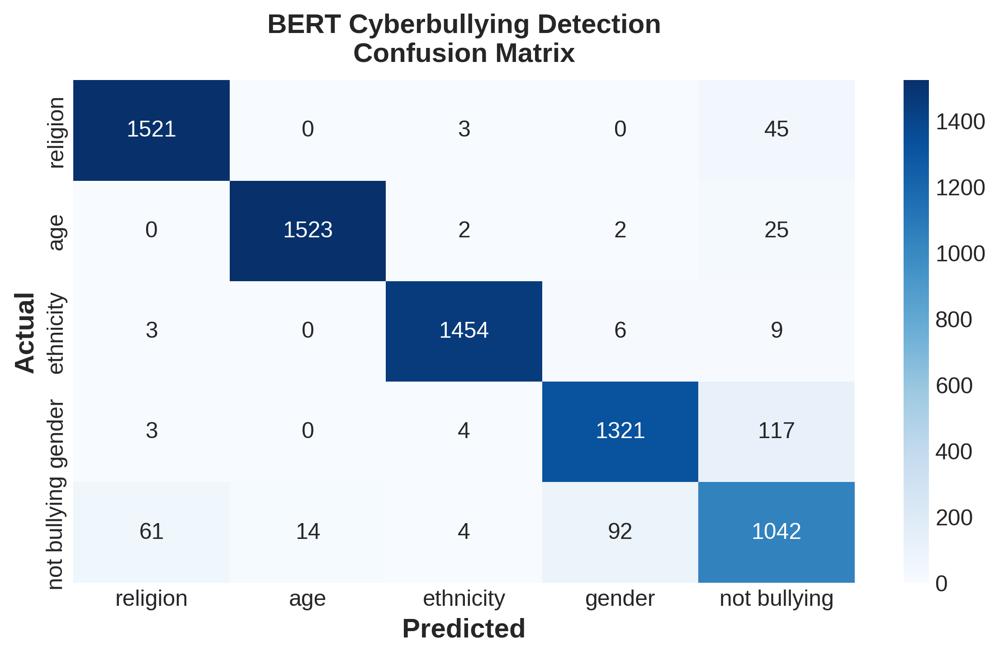

In [148]:
cm = confusion_matrix(y_test_similarity, bert_preds_similarity)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 5), dpi=300)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=sentiments, yticklabels=sentiments)
plt.title("BERT Cyberbullying Detection\nConfusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

<br></br>

**Observation on Data Imbalance: Despite not using oversampling to balance the data for the non-cyberbullying label, the validation and test accuracies showed a significant decrease with the same BERT model architecture compared to when oversampling was applied. The next step involves visualizing the attention heads to understand how BERT identifies relationships and patterns between words.**

In [149]:
model_sampled = BertModel.from_pretrained('bert-base-uncased', output_attentions=True).to(device)
model_unsampled = bert_classifier_similarity

tokenizer_sampled = BertTokenizer.from_pretrained("bert-base-uncased")
tokenizer_unsampled = tokenizer_similarity

In [150]:
# Let's take one of the inputs from test dataset to view the attention heads
visualization_index = 0
X_test[3], X_test[0]

('hey stupid nigger jazz win dumb fuck',
 'course christian world oppressed daily muslim bigotry')

In [151]:
inputs = tokenizer_sampled.encode_plus(X_test[0], X_test[3], return_tensors='pt')
input_ids = inputs['input_ids'].to(device)
token_type_ids = inputs['token_type_ids'].to(device)
attention = model_sampled(input_ids, token_type_ids)[-1]
sentence_b_start = token_type_ids[0].tolist().index(1)
input_id_list = input_ids[0].tolist() # Batch index 0
tokens = tokenizer_sampled.convert_ids_to_tokens(input_id_list)

In [152]:
html_head_view = head_view(attention, tokens, sentence_b_start, html_action="return")

In [153]:
with open("head_view.html", 'w') as file:
    file.write(html_head_view.data)

In [ ]:
# Sum the absolute values across classes to get an overall importance score for each feature
feature_importance = np.sum(np.abs(classifier_weights), axis=0)

# Plot the feature importance as a bar plot
plt.figure(figsize=(10, 4), dpi=300)
plt.bar(range(len(feature_importance)), feature_importance)
plt.xlabel('Feature Index')
plt.ylabel('Importance Score')
plt.title('Feature Importance (Absolute Sum of Final Layer Weights)')
plt.show()

<br></br>
### **Density Plot of last layer weights**

<ipython-input-181-533b84ec4d4b>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(flattened_weights, shade=True, color='blue')


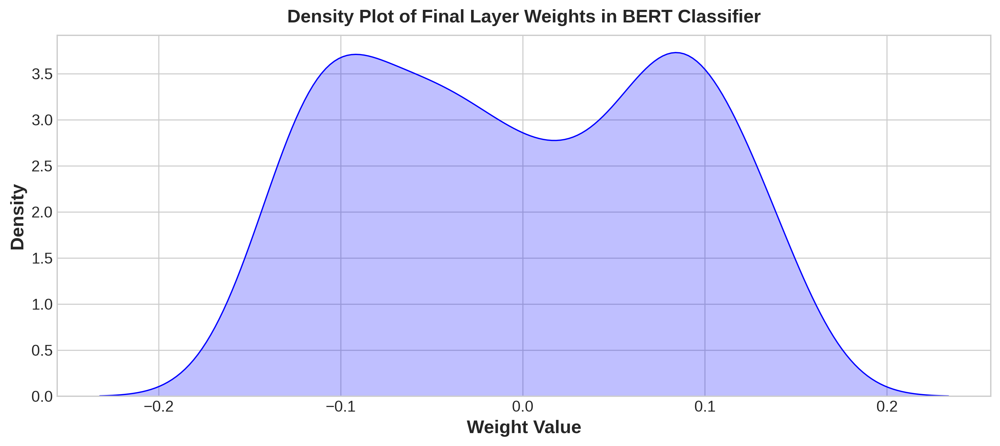

In [181]:
# Extract weights from the final classification layer
classifier_weights = bert_classifier.classifier[-1].weight.data.cpu().numpy()

# Flatten the weight matrix into a 1D array for density plotting
flattened_weights = classifier_weights.flatten()

# Create a density plot using seaborn
plt.figure(figsize=(11, 5), dpi=300)
sns.kdeplot(flattened_weights, shade=True, color='blue')
plt.xlabel('Weight Value')
plt.ylabel('Density')
plt.title('Density Plot of Final Layer Weights in BERT Classifier')
# plt.grid(visible=True)
plt.show()

<br></br>
#### **Observations**
- The density plot has a smoother and more balanced shape, indicating that the weights are distributed more evenly.
- The plot shows two primary peaks, suggesting the model is relying on two main groups of features or patterns for classification.

<ipython-input-182-897df19b15de>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(flattened_weights, shade=True, color='blue')


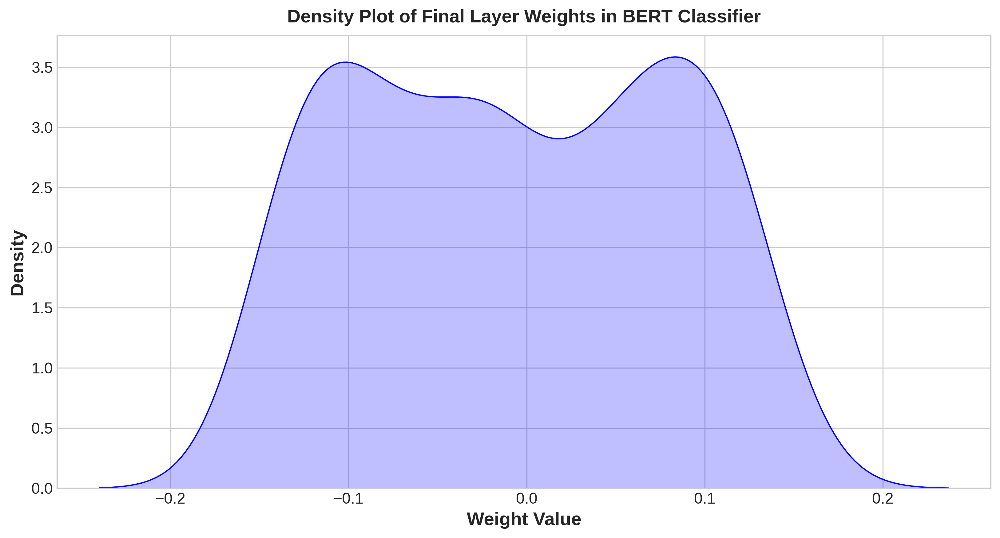

In [182]:
# Extract weights from the final classification layer
classifier_weights = bert_classifier_similarity.classifier[-1].weight.data.cpu().numpy()

# Flatten the weight matrix into a 1D array for density plotting
flattened_weights = classifier_weights.flatten()

# Create a density plot using seaborn
plt.figure(figsize=(11, 6), dpi=300)
sns.kdeplot(flattened_weights, shade=True, color='blue')
plt.xlabel('Weight Value')
plt.ylabel('Density')
plt.title('Density Plot of Final Layer Weights in BERT Classifier')
plt.savefig("last_layer_density_plot_similarity.png", dpi=300)
# plt.grid(visible=True)
plt.show()

<br></br>
#### **Observations**
- This density plot shows a similar shape but with more pronounced peaks and valleys, indicating less smoothness in weight distribution.

- The plot shows two primary peaks, suggesting the model is relying on two main groups of features or patterns for classification and the plots looks less balanced and more irregular.

<br></br>
#### **Cosine Similarity**

In [185]:
from sklearn.metrics.pairwise import cosine_similarity

classifier1_weights = bert_classifier.classifier[-1].weight.data.cpu().numpy()
classifier2_weights = bert_classifier_similarity.classifier[-1].weight.data.cpu().numpy()

# Let's see the shape of classifier1_weights
classifier1_weights.shape, classifier2_weights.shape

((5, 50), (5, 50))